In [1]:
# !pip install catboost
# !pip install optuna

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import optuna

from sklearn.model_selection import train_test_split, cross_validate, StratifiedKFold
from sklearn.preprocessing import StandardScaler, QuantileTransformer
from sklearn.ensemble import RandomForestRegressor, VotingRegressor, StackingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.compose import ColumnTransformer
from sklearn.metrics import mean_absolute_percentage_error, mean_absolute_error, mean_squared_error, r2_score
from sklearn.decomposition import PCA
from sklearn.pipeline import FeatureUnion
from sklearn.inspection import PartialDependenceDisplay

from xgboost import XGBRegressor, plot_importance
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor

from imblearn.pipeline import Pipeline
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler, TomekLinks
from imblearn.combine import SMOTETomek

from itertools import combinations

import pandas as pd

/usr/local/lib/python3.10/dist-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


In [3]:
!ls

KERNEL2-Copy1.ipynb  KERNEL2.ipynb	   data.npz	     test.csv
KERNEL2-Copy2.ipynb  KERNEL_DA.ipynb	   kernel_test.docx  train.csv
KERNEL2-Copy3.ipynb  KERNEL_initial.ipynb  submission.csv
KERNEL2-Copy4.ipynb  catboost_info	   submission1.csv


In [4]:
##### LOAD TRAIN/TEST DATEST AND COMBINE THEM ##################

train = pd.read_csv('train.csv')
train['Dataset'] = 'train'
# Reorder columns to have 'train' at the first position
train = train[['Dataset'] + [col for col in train.columns if col != 'Dataset']]
# display(train)

test = pd.read_csv('test.csv')
test['Dataset'] = 'test'
# Reorder columns to have 'test' at the first position
test = test[['Dataset'] + [col for col in test.columns if col != 'Dataset']]

# display(test)

data = pd.concat([train, test], axis=0)
data = data.reset_index(drop=True)

display(data)

show_check = False

# fn

,Dataset,Field,Year,Cluster,Area,Yield,Geozone,Predecessor,FAO,N_kg/ga,...,30_week_ndvi,31_week_ndvi,32_week_ndvi,33_week_ndvi,34_week_ndvi,35_week_ndvi,36_week_ndvi,37_week_ndvi,38_week_ndvi,39_week_ndvi
0,train,1310,2019,1,79.263,129.077355,12,0,320.0,222.330633,...,0.757000,0.760333,0.698000,0.6610,0.60100,0.538000,0.4710,0.402333,0.347375,0.343
1,train,1315,2018,1,115.484,190.068235,12,0,360.0,202.932162,...,0.734968,0.734000,0.736250,0.7140,0.68300,0.624429,0.5905,0.511000,0.463333,0.410
2,train,1315,2019,1,83.883,149.674818,12,0,320.0,229.686158,...,0.693000,0.664300,0.666000,0.6230,0.57800,0.508000,0.4380,0.366667,0.333125,0.325
3,train,1312,2018,1,55.964,181.336145,12,0,360.0,209.345544,...,0.751783,0.737000,0.735000,0.7095,0.68075,0.646286,0.6115,0.540000,0.476000,0.405
4,train,1312,2019,1,55.965,148.165017,12,0,320.0,204.983972,...,0.735000,0.715300,0.679000,0.6650,0.63000,0.569000,0.5010,0.460714,0.399500,0.387
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7921,test,2743,2020,6,30.444,0.000000,25,0,NaN,170.663185,...,0.600800,0.534000,0.502000,0.4240,0.43200,0.413000,0.4030,0.349000,0.293000,0.000
7922,test,3002,2020,5,102.733,0.000000,42,1,320.0,106.382623,...,0.637500,0.555000,0.485000,0.4180,0.33200,0.275500,0.2630,0.259000,0.212000,0.000
7923,test,3000,2020,5,111.347,0.000000,42,1,320.0,100.968073,...,0.592000,0.555500,0.488571,0.4060,0.32425,0.257500,0.2470,0.245333,0.220000,0.000
7924,test,3001,2020,5,152.212,0.000000,42,1,320.0,103.299175,...,0.648500,0.565750,0.495714,0.4200,0.32525,0.269000,0.2490,0.244000,0.224000,0.000


In [5]:
###### PARSE NAMES FOR _YEARLY_ COLUMNS ##############################
# Extract unique cols for _YEARLY_median_
MONTH_YEARLY_median_ = data.columns.str.extract(r'^(.*?)_YEARLY_median_')[0].unique()
_YEARLY_median_FEATURE = data.columns.str.extract(r'_YEARLY_median_(.*)$')[0].unique()

MONTH_YEARLY_median_ = MONTH_YEARLY_median_[1:]
_YEARLY_median_FEATURE = _YEARLY_median_FEATURE[1:]
print("Unique MONTH_YEARLY_median_ values:", MONTH_YEARLY_median_)
print("Unique _YEARLY_median_FEATURE values:", _YEARLY_median_FEATURE)

# Extract unique cols for _YEARLY_sum_
MONTH_YEARLY_sum_ = data.columns.str.extract(r'^(.*?)_YEARLY_sum_')[0].unique()
_YEARLY_sum_FEATURE = data.columns.str.extract(r'_YEARLY_sum_(.*)$')[0].unique()

MONTH_YEARLY_sum_ = MONTH_YEARLY_sum_[1:]
_YEARLY_sum_FEATURE = _YEARLY_sum_FEATURE[1:]
print("Unique MONTH_YEARLY_sum_ values:", MONTH_YEARLY_sum_)
print("Unique _YEARLY_sum_FEATURE values:", _YEARLY_sum_FEATURE)

Unique MONTH_YEARLY_median_ values: ['5' '6' '7' '8' '9']
Unique _YEARLY_median_FEATURE values: ['AVERAGE_TEMPERATURE' 'EVAPORATION' 'HUMIDITY(%)']
Unique MONTH_YEARLY_sum_ values: ['5' '6' '7' '8' '9']
Unique _YEARLY_sum_FEATURE values: ['CALCULATED_RADIATION' 'RAINFALL']


In [6]:
###### PARSE NAMES FOR _WEEKLY_ COLUMNS ##############################
# Extract unique cols for XX_WEEK_FEATURE
XX_WEEK_ = data.columns.str.extract(r'^(.*?)_WEEK_')[0].unique()
_WEEK_FEATURE = data.columns.str.extract(r'_WEEK_(.*)$')[0].unique()

XX_WEEK_ = XX_WEEK_[1:]
_WEEK_FEATURE = _WEEK_FEATURE[1:]
print("Unique NUM_WEEK_ values:", XX_WEEK_)
print("Unique _WEEK_FEATURE values:", _WEEK_FEATURE)

Unique NUM_WEEK_ values: ['22' '23' '24' '25' '26' '27' '28' '29' '30' '31' '32' '33' '34' '35'
 '36' '37' '38' '39']
Unique _WEEK_FEATURE values: ['AVERAGE_TEMPERATURE' 'CALCULATED_RADIATION' 'EVAPORATION' 'HUMIDITY(%)'
 'RAINFALL' 'SUM_ACTIVE_TEMPERATURE']


In [7]:
###### PARSE NAMES FOR _WEEKLY_ COLUMNS ##############################
# Extract unique cols for XX_WEEK_FEATURE
XX_WEEK_ = data.columns.str.extract(r'^(.*?)_week_')[0].unique()
_WEEK_NDVI = data.columns.str.extract(r'_week_(.*)$')[0].unique()

XX_WEEK_ = XX_WEEK_[1:]
_WEEK_NDVI = _WEEK_NDVI[1:]
print("Unique num_week_ values:", XX_WEEK_)
print("Unique _week_FEATURE values:", _WEEK_NDVI)    

# fn

Unique num_week_ values: ['22' '23' '24' '25' '26' '27' '28' '29' '30' '31' '32' '33' '34' '35'
 '36' '37' '38' '39']
Unique _week_FEATURE values: ['ndvi']


In [8]:
# Convert DataFrame to dictionary
# Create a dictionary to store results

def dataframe_todict(df):
    result_dict = {}

    # Iterate through the original DataFrame
    for _, row in df.iterrows():
        row_dict = {'Dataset': str(row['Dataset']), 'Field': int(row['Field']), 'Year': int(row['Year']), 'Cluster': int(row['Cluster']), 'Area': row['Area'], \
                    'Yield': row['Yield'], 'Geozone': int(row['Geozone']), 'Predecessor': int(row['Predecessor']), 'FAO': row['FAO'], \
                    'N_kg/ga': row['N_kg/ga'], 'P_kg/ga': row['P_kg/ga'], 'K_kg/ga': row['K_kg/ga']}
        ##### FOR YEARLY_median_
        for feature_name in _YEARLY_median_FEATURE:
            feature_key = f'YEARLY_median_{feature_name}'
            feature_values = [row[f'{month}_YEARLY_median_{feature_name}'] for month in MONTH_YEARLY_median_]
            row_dict[feature_key] = feature_values
        ##### FOR YEARLY_sum_
        for feature_name in _YEARLY_sum_FEATURE:
            feature_key = f'YEARLY_sum_{feature_name}'
            feature_values = [row[f'{month}_YEARLY_sum_{feature_name}'] for month in MONTH_YEARLY_sum_]
            row_dict[feature_key] = feature_values
        ##### _WEEK_FEATURE_
        for feature_name in _WEEK_FEATURE:
            feature_key = f'WEEK_{feature_name}'
            feature_values = [row[f'{month}_WEEK_{feature_name}'] for month in XX_WEEK_]
            row_dict[feature_key] = feature_values

        ##### _WEEK_NDVI_
        for feature_name in _WEEK_NDVI:
            feature_key = f'WEEK_{feature_name}'
            feature_values = [row[f'{month}_week_{feature_name}'] for month in XX_WEEK_]
            row_dict[feature_key] = feature_values

        result_dict[_] = row_dict

    return result_dict

data_dict = dataframe_todict(data)

# print(data_dict[0])

In [9]:
# Get unique keys from the outer dictionary
unique_keys = set(data_dict[0].keys())

print("Unique Keys:", len(unique_keys), unique_keys)

Unique Keys: 24 {'Area', 'P_kg/ga', 'WEEK_ndvi', 'YEARLY_median_EVAPORATION', 'WEEK_RAINFALL', 'YEARLY_median_HUMIDITY(%)', 'Predecessor', 'N_kg/ga', 'YEARLY_median_AVERAGE_TEMPERATURE', 'WEEK_EVAPORATION', 'Yield', 'WEEK_HUMIDITY(%)', 'Dataset', 'WEEK_CALCULATED_RADIATION', 'WEEK_AVERAGE_TEMPERATURE', 'Field', 'Geozone', 'Cluster', 'FAO', 'Year', 'YEARLY_sum_RAINFALL', 'K_kg/ga', 'YEARLY_sum_CALCULATED_RADIATION', 'WEEK_SUM_ACTIVE_TEMPERATURE'}


In [10]:
##### CONVERT TO NDARRAY AND SAVE TO NPZ #############
##### HALPFULL FOR FARTHER DATA PROCESSING (more faster) or NN approach ###########
### don't mind this 

# Extract unique 'Cluster' values
unique_clusters = set(entry['Cluster'] for entry in data_dict.values() if 'Cluster' in entry)

print("Unique Clusters:", unique_clusters)

def dict_to_array(data_dict, file_name='train.npz'):

    # Convert the dictionary of dictionaries to a list of dictionaries
    train_list = [{'record_id': key, **value} for key, value in data_dict.items()]

    Dataset = []
    Field = []
    Year = []
    Cluster = []
    Area = []
    Yield = []
    Geozone = []
    Predecessor = []
    FAO = []
    N = []
    P = []
    K = []

    WEEK_CALCULATED_RADIATION = []
    WEEK_SUM_ACTIVE_TEMPERATURE = []
    WEEK_HUMIDITY = []
    WEEK_EVAPORATION = []
    WEEK_RAINFALL = []
    WEEK_AVERAGE_TEMPERATURE = []
    WEEK_NDVI = []

    YEARLY_median_HUMIDITY = []
    YEARLY_sum_CALCULATED_RADIATION = []
    YEARLY_median_AVERAGE_TEMPERATURE = []
    YEARLY_sum_RAINFALL = []
    YEARLY_median_EVAPORATION = []

    for ii in range(len(train_list)):
        Dataset.append(train_list[ii]['Dataset'])
        Field.append(train_list[ii]['Field'])
        Year.append(train_list[ii]['Year'])
        Cluster.append(train_list[ii]['Cluster'])
        Area.append(train_list[ii]['Area'])

        Yield.append(train_list[ii]['Yield'])
        Geozone.append(train_list[ii]['Geozone'])
        Predecessor.append(train_list[ii]['Predecessor'])
        FAO.append(train_list[ii]['FAO'])

        N.append(train_list[ii]['N_kg/ga'])
        P.append(train_list[ii]['P_kg/ga'])
        K.append(train_list[ii]['K_kg/ga'])

        WEEK_CALCULATED_RADIATION.append(train_list[ii]['WEEK_CALCULATED_RADIATION'])
        WEEK_SUM_ACTIVE_TEMPERATURE.append(train_list[ii]['WEEK_SUM_ACTIVE_TEMPERATURE'])
        WEEK_HUMIDITY.append(train_list[ii]['WEEK_HUMIDITY(%)'])
        WEEK_EVAPORATION.append(train_list[ii]['WEEK_EVAPORATION'])
        WEEK_RAINFALL.append(train_list[ii]['WEEK_RAINFALL'])
        WEEK_AVERAGE_TEMPERATURE.append(train_list[ii]['WEEK_AVERAGE_TEMPERATURE'])
        WEEK_NDVI.append(train_list[ii]['WEEK_ndvi'])

        YEARLY_median_HUMIDITY.append(train_list[ii]['YEARLY_median_HUMIDITY(%)'])
        YEARLY_median_AVERAGE_TEMPERATURE.append(train_list[ii]['YEARLY_median_AVERAGE_TEMPERATURE'])
        YEARLY_median_EVAPORATION.append(train_list[ii]['YEARLY_median_EVAPORATION'])

        YEARLY_sum_CALCULATED_RADIATION.append(train_list[ii]['YEARLY_sum_CALCULATED_RADIATION'])
        YEARLY_sum_RAINFALL.append(train_list[ii]['YEARLY_sum_RAINFALL'])

    import numpy as np

    np.savez(
        file_name,

        Dataset=np.array(Dataset),
        Field=np.array(Field),
        Year=np.array(Year),
        Cluster=np.array(Cluster),
        Area=np.array(Area),

        Yield=np.array(Yield),
        Geozone=np.array(Geozone),
        Predecessor=np.array(Predecessor),
        FAO=np.array(FAO),

        N=np.array(N),
        P=np.array(P),
        K=np.array(K),

        WEEK_CALCULATED_RADIATION=np.stack(WEEK_CALCULATED_RADIATION),
        WEEK_SUM_ACTIVE_TEMPERATURE=np.stack(WEEK_SUM_ACTIVE_TEMPERATURE),
        WEEK_HUMIDITY=np.stack(WEEK_HUMIDITY),
        WEEK_EVAPORATION=np.stack(WEEK_EVAPORATION),
        WEEK_RAINFALL=np.stack(WEEK_RAINFALL),
        WEEK_AVERAGE_TEMPERATURE=np.stack(WEEK_AVERAGE_TEMPERATURE),
        WEEK_NDVI=np.stack(WEEK_NDVI),

        YEARLY_median_HUMIDITY=np.stack(YEARLY_median_HUMIDITY),
        YEARLY_median_AVERAGE_TEMPERATURE=np.stack(YEARLY_median_AVERAGE_TEMPERATURE),
        YEARLY_median_EVAPORATION=np.stack(YEARLY_median_EVAPORATION),
        YEARLY_sum_CALCULATED_RADIATION=np.stack(YEARLY_sum_CALCULATED_RADIATION),
        YEARLY_sum_RAINFALL=np.stack(YEARLY_sum_RAINFALL),

    )


data_dict = dataframe_todict(data)

dict_to_array(data_dict, 'data.npz')

Unique Clusters: {0, 1, 2, 3, 4, 5, 6}


In [11]:
np_data = np.load('data.npz')
np_data = dict(np_data)

# @GLOBAL NAME #
FEATURE_NAME_LIST = ['Dataset', 'Field', 'Year', 'Cluster', 'Area', 'Yield', 'Geozone', 'Predecessor', 'FAO', 'N', 'P', 'K']

# @GLOBAL NAME #
WEEKLY_FEATURE_NAME_LIST = ['WEEK_AVERAGE_TEMPERATURE', 'WEEK_RAINFALL', 'WEEK_EVAPORATION', 'WEEK_HUMIDITY', 'WEEK_CALCULATED_RADIATION', 'WEEK_SUM_ACTIVE_TEMPERATURE', 'WEEK_NDVI']

# @GLOBAL NAME #
YEARLY_FEATURE_NAME_LIST = ['YEARLY_median_AVERAGE_TEMPERATURE', 'YEARLY_sum_RAINFALL', 'YEARLY_median_EVAPORATION', 'YEARLY_median_HUMIDITY',   'YEARLY_sum_CALCULATED_RADIATION', ]


In [12]:
############# PUT ORIGINAL in PANDAS DATAFRAME format #############################

def dict_to_df(np_data):
    original_data = pd.DataFrame([])
    
    for ii, feature_name in enumerate(FEATURE_NAME_LIST):
        data = pd.DataFrame(np_data[feature_name], columns=[feature_name])
        original_data = pd.concat([original_data, data], axis=1)
    
    
    nums_weeks=[x for x in range(22, 40)]
    
    for feature_name in WEEKLY_FEATURE_NAME_LIST:            
        cols_names = [f'{feature_name}_{x}' for x in nums_weeks]
        data = pd.DataFrame(np_data[feature_name], columns=cols_names)
        original_data = pd.concat([original_data, data], axis=1)
    
    
    nums_month=[x for x in range(5, 10)]
    
    for feature_name in YEARLY_FEATURE_NAME_LIST:            
        cols_names = [f'{feature_name}_{x}' for x in nums_month]
        data = pd.DataFrame(np_data[feature_name], columns=cols_names)
        original_data = pd.concat([original_data, data], axis=1)

    return original_data

original_data = dict_to_df(np_data)

display('Original dataset:', original_data)

'Original dataset:'

,Dataset,Field,Year,Cluster,Area,Yield,Geozone,Predecessor,FAO,N,...,YEARLY_median_HUMIDITY_5,YEARLY_median_HUMIDITY_6,YEARLY_median_HUMIDITY_7,YEARLY_median_HUMIDITY_8,YEARLY_median_HUMIDITY_9,YEARLY_sum_CALCULATED_RADIATION_5,YEARLY_sum_CALCULATED_RADIATION_6,YEARLY_sum_CALCULATED_RADIATION_7,YEARLY_sum_CALCULATED_RADIATION_8,YEARLY_sum_CALCULATED_RADIATION_9
0,train,1310,2019,1,79.263,129.077355,12,0,320.0,222.330633,...,65.0,67.0,67.0,65.0,71.0,9779661.0,10016516.0,10183113.0,8751805.0,6020978.0
1,train,1315,2018,1,115.484,190.068235,12,0,360.0,202.932162,...,65.0,67.0,67.0,65.0,71.0,9779661.0,10016516.0,10183113.0,8751805.0,6020978.0
2,train,1315,2019,1,83.883,149.674818,12,0,320.0,229.686158,...,65.0,67.0,67.0,65.0,71.0,9779661.0,10016516.0,10183113.0,8751805.0,6020978.0
3,train,1312,2018,1,55.964,181.336145,12,0,360.0,209.345544,...,65.0,67.0,67.0,65.0,71.0,9779661.0,10016516.0,10183113.0,8751805.0,6020978.0
4,train,1312,2019,1,55.965,148.165017,12,0,320.0,204.983972,...,65.0,67.0,67.0,65.0,71.0,9779661.0,10016516.0,10183113.0,8751805.0,6020978.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7921,test,2743,2020,6,30.444,0.000000,25,0,NaN,170.663185,...,62.0,64.0,63.0,61.0,68.0,10325304.0,10655392.0,10862387.0,9458386.0,6476889.0
7922,test,3002,2020,5,102.733,0.000000,42,1,320.0,106.382623,...,61.0,58.0,61.0,54.0,63.0,14618111.0,15359101.0,15407815.0,13659292.0,9118461.0
7923,test,3000,2020,5,111.347,0.000000,42,1,320.0,100.968073,...,61.0,58.0,61.0,54.0,63.0,14618111.0,15359101.0,15407815.0,13659292.0,9118461.0
7924,test,3001,2020,5,152.212,0.000000,42,1,320.0,103.299175,...,61.0,58.0,61.0,54.0,63.0,14618111.0,15359101.0,15407815.0,13659292.0,9118461.0


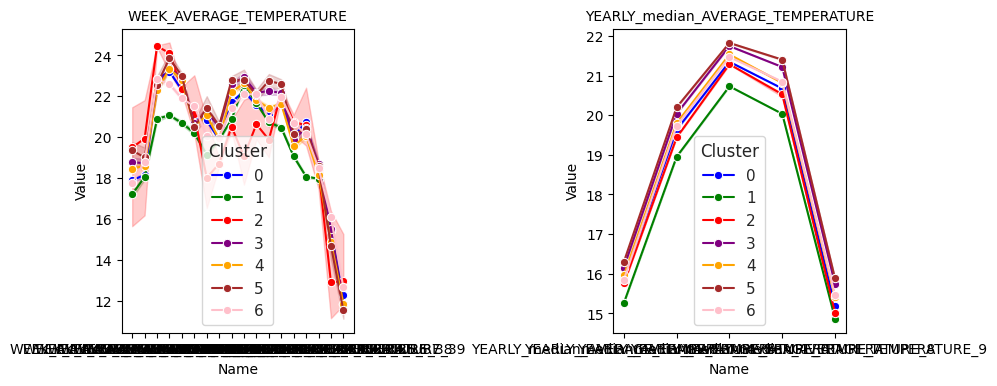

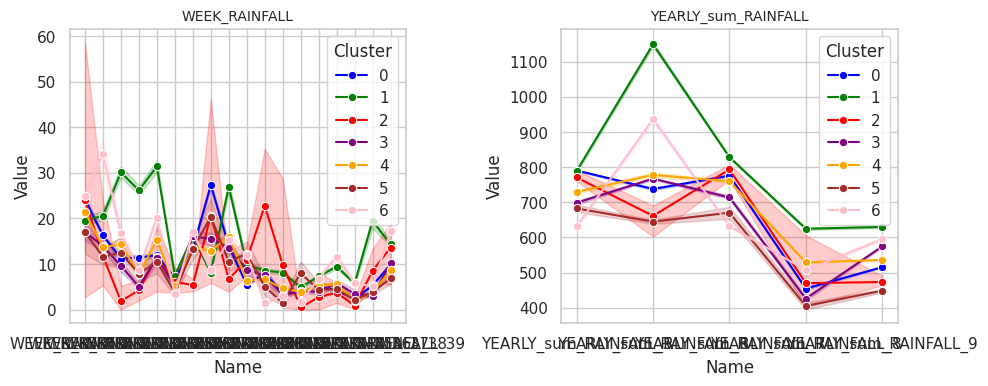

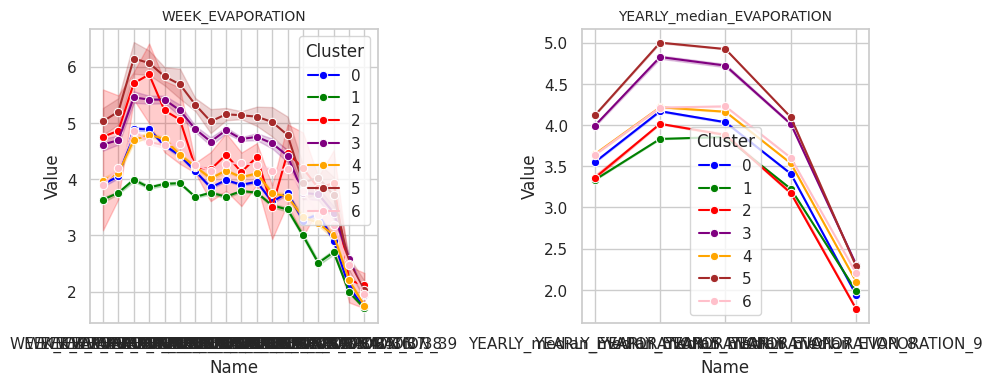

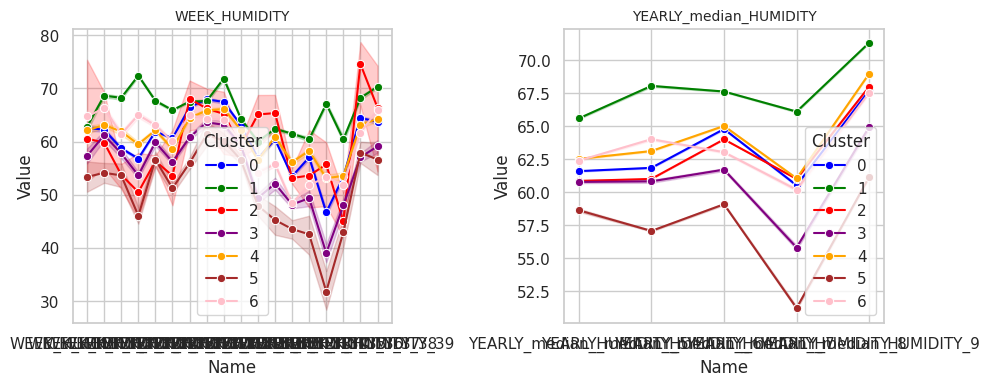

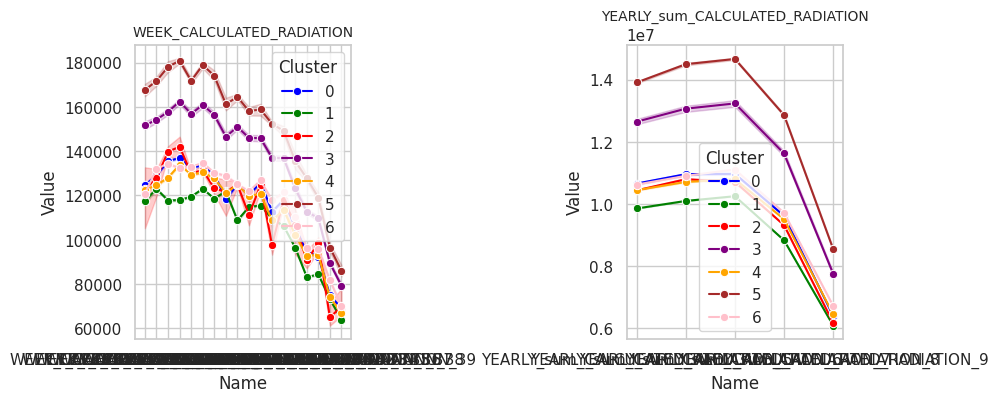

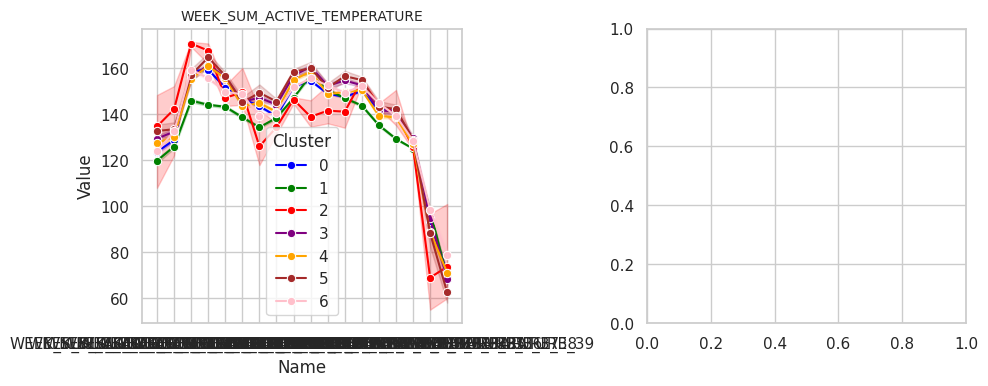

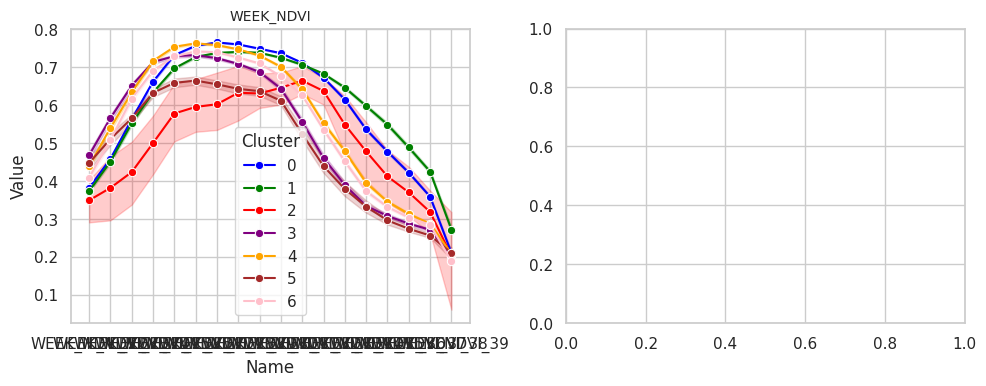

In [13]:
######## VISUALIZE WEATHER FOR UNDERSTANDING DATA ###############################

color_vector = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink']
# color_vector = ['r', 'g', 'b', 'm', 'c', 'y', 'aquamarine']

###### PLOT ORIGINAL WEATHER FOR CLUSTER ###########               
show_check = True
if show_check == True:
    ################# PLOT WEATHER ################################
    for ii, feature_name in enumerate(WEEKLY_FEATURE_NAME_LIST):
        fig, ax = plt.subplots(1, 2, figsize=(10, 4))
        axs = ax.flat
        sns.set(style="whitegrid")
        ############# FOR WEEKLY #####################################################
        cols_names = [f'{feature_name}_{x}' for x in range(22, 40)]
        selected_df = original_data[cols_names + ['Cluster']]
        
        # Melt the DataFrame
        melted_df = pd.melt(selected_df, id_vars=['Cluster'], var_name='Name', value_name='Value')    
        
        sns.lineplot(x='Name', y='Value', hue='Cluster', 
                     ax=axs[0], data=melted_df, palette=color_vector, 
                     marker='o').set_title(f'{feature_name}', fontsize=10)
        ############### FOR YEARLY #####################################################   
        if ii < len(YEARLY_FEATURE_NAME_LIST):            
            feature_name = YEARLY_FEATURE_NAME_LIST[ii]
            
            cols_names = [f'{feature_name}_{x}' for x in range(5, 10)]
            selected_df = original_data[cols_names + ['Cluster']]
            
            # Melt the DataFrame
            melted_df = pd.melt(selected_df, id_vars=['Cluster'], var_name='Name', value_name='Value')
            
            sns.lineplot(x='Name', y='Value', hue='Cluster', 
                         ax=axs[1], data=melted_df, palette=color_vector, 
                         marker='o').set_title(f'{feature_name}', fontsize=10)

        fig.tight_layout(pad=1)

In [14]:
# ###### Normalize/Standardize WEATHER ###########################
#### use StandartScaler with PCA for each Geozone or each Cluste r########

################# TODO ##############################################################      
##### Explain TODO's: because the growth process of the crops is divided into critical periods, 
#####                 the selection of specific basis function can be more suitable
##### TODO: 1. Discrete Wavelet (Haar‐Wavelets), 2.  Piecewise Aggregate Approximation, 3. Adaptive Piecewise Constant 

################# TODO #############################################################
######## TODO: need to be parralelized with multithreading, because too long execution
######## TODO: scaler.fit_transform for train data only, use scaler.transform for test dataset ##################
######## comment: Geozone aggregation temporaray changed by Cluster aggregation for more fast execution, 

##### MAYBE UNSCALED VARIABLES ###############
# np_data['YEARLY_sum_RAINFALL'] = np_data['YEARLY_sum_RAINFALL'] / 18
# np_data['YEARLY_sum_CALCULATED_RADIATION'] = np_data['YEARLY_sum_CALCULATED_RADIATION'] / 18

######## use CLEAR function for drop understandable data ##########
def clear_df(data):
    ##### !!!!! drop Geozone 42 it contain only test fields or add to Cluster 5 with closer mean Geozone
    data = data[ data['Geozone'] != 42 ]
    
    ##### !!!! drop Cluster 2, only 4 - fields, 1 - test, or add to closer Geozone (may be) 
    data = data[ data['Cluster'] != 2 ]

    return data

##### for fast check pipline, used later #############
ORIGINAL_DATA = original_data.copy()
####

original_data = clear_df(original_data)

def get_PCA(data, weather_feature, threshold=0.999, ):
    # # Standardize the data (mean=0 and variance=1)
    # scaler = StandardScaler()
    # scaled_data = scaler.fit_transform(df)
    
    # Apply PCA
    # Fit PCA to the data
    pca = PCA()
    pca.fit(data)

    # Determine the number of components based on the explained variance
    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    num_components = np.argmax(cumulative_variance >= threshold) + 1

    # Use the determined number of components
    pca = PCA(n_components=num_components)
    principal_components = pca.fit_transform(data)
    
    # Create a DataFrame with the principal components
    columns = [f'PCA_{weather_feature}_{i}' for i in range(principal_components.shape[1])]
    pc_df = pd.DataFrame(data=principal_components, columns=columns)
    
    # Concatenate the principal components DataFrame with the original DataFrame
    result_df = pd.concat([scaled_data, pc_df], axis=1)

    return result_df


def ScaleWeatherAOI(df, weather_feature, aggregation_by='Cluster', do_pca=False):
    # Separate data by Geozone
    geozone_data = {}
    for geozone in df[aggregation_by].unique():
        geozone_data[geozone] = df[df[aggregation_by] == geozone].copy()
    
    # Apply StandardScaler for each Geozone on weather columns
    scalers = {}
    scaled_data = pd.DataFrame()  
    
    for geozone, geozone_df in geozone_data.items():
        
        scaler = StandardScaler()
        
        # Select only the weather columns for scaling
        weather_columns = geozone_df.columns[geozone_df.columns.str.startswith(f'{weather_feature}_')]
        scaled_weather = scaler.fit_transform(geozone_df[weather_columns])

        if do_pca == True:
            pca_weather = get_PCA(scaled_weather, weather_feature, threshold=0.95,)
        
        # Store the scaler for later use if needed
        scalers[geozone] = scaler
        
        # Append the scaled data to the overall result
        if do_pca == True:
            scaled_data = pd.concat([scaled_data, pca_weather], ignore_index=True)
        else:
            # Replace the original weather columns with scaled values
            geozone_df[weather_columns] = scaled_weather
            scaled_data = pd.concat([scaled_data, geozone_df], ignore_index=True)
            
    return scaled_data

scaled_data = original_data

##### Scale and PCA's WEEKLY WEATHER FEATURES
for weekly_future in WEEKLY_FEATURE_NAME_LIST:
    scaled_data = ScaleWeatherAOI(scaled_data, weekly_future)

# Display the result
display(scaled_data)

#### for further steps ####
original_data = scaled_data

,Dataset,Field,Year,Cluster,Area,Yield,Geozone,Predecessor,FAO,N,...,YEARLY_median_HUMIDITY_5,YEARLY_median_HUMIDITY_6,YEARLY_median_HUMIDITY_7,YEARLY_median_HUMIDITY_8,YEARLY_median_HUMIDITY_9,YEARLY_sum_CALCULATED_RADIATION_5,YEARLY_sum_CALCULATED_RADIATION_6,YEARLY_sum_CALCULATED_RADIATION_7,YEARLY_sum_CALCULATED_RADIATION_8,YEARLY_sum_CALCULATED_RADIATION_9
0,train,1310,2019,1,79.263,129.077355,12,0,320.0,222.330633,...,65.0,67.0,67.0,65.0,71.0,9779661.0,10016516.0,10183113.0,8751805.0,6020978.0
1,train,1315,2018,1,115.484,190.068235,12,0,360.0,202.932162,...,65.0,67.0,67.0,65.0,71.0,9779661.0,10016516.0,10183113.0,8751805.0,6020978.0
2,train,1315,2019,1,83.883,149.674818,12,0,320.0,229.686158,...,65.0,67.0,67.0,65.0,71.0,9779661.0,10016516.0,10183113.0,8751805.0,6020978.0
3,train,1312,2018,1,55.964,181.336145,12,0,360.0,209.345544,...,65.0,67.0,67.0,65.0,71.0,9779661.0,10016516.0,10183113.0,8751805.0,6020978.0
4,train,1312,2019,1,55.965,148.165017,12,0,320.0,204.983972,...,65.0,67.0,67.0,65.0,71.0,9779661.0,10016516.0,10183113.0,8751805.0,6020978.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7913,test,286,2020,6,31.115,0.000000,19,1,360.0,187.876105,...,63.0,64.0,63.0,61.0,68.0,10689032.0,11052625.0,11243224.0,9808771.0,6767632.0
7914,test,305,2020,6,106.814,0.000000,19,1,360.0,192.701593,...,63.0,64.0,63.0,61.0,68.0,10689032.0,11052625.0,11243224.0,9808771.0,6767632.0
7915,test,292,2020,6,64.673,0.000000,19,1,360.0,189.152769,...,63.0,64.0,63.0,61.0,68.0,10689032.0,11052625.0,11243224.0,9808771.0,6767632.0
7916,test,291,2020,6,34.607,0.000000,19,1,360.0,187.967348,...,63.0,64.0,63.0,61.0,68.0,10689032.0,11052625.0,11243224.0,9808771.0,6767632.0


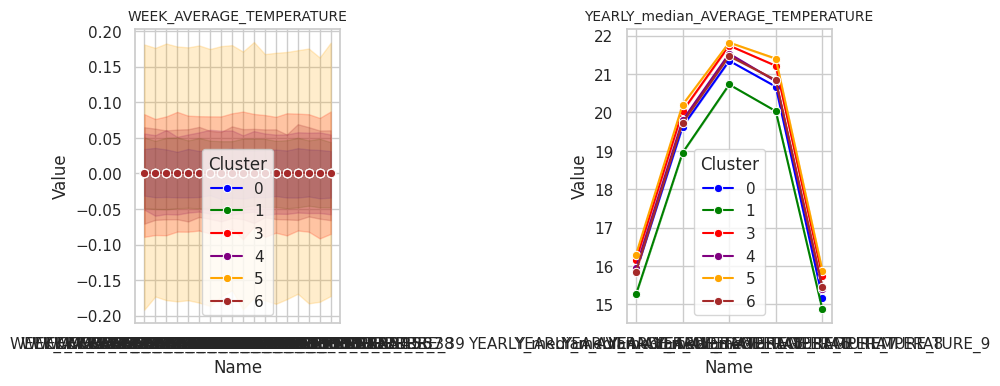

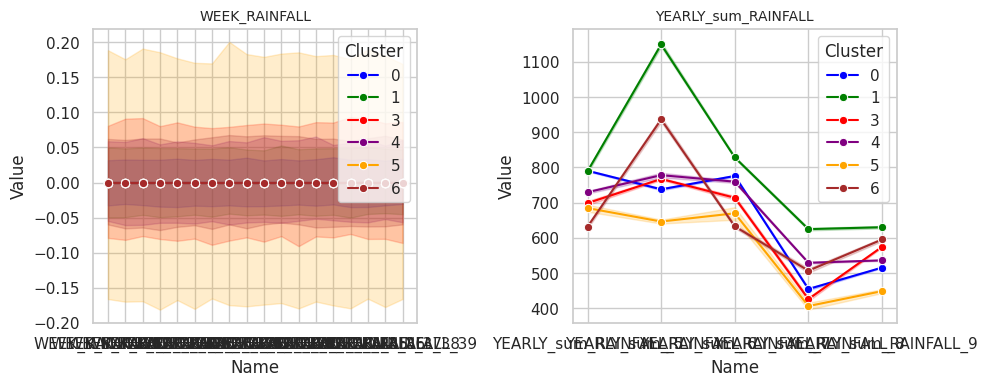

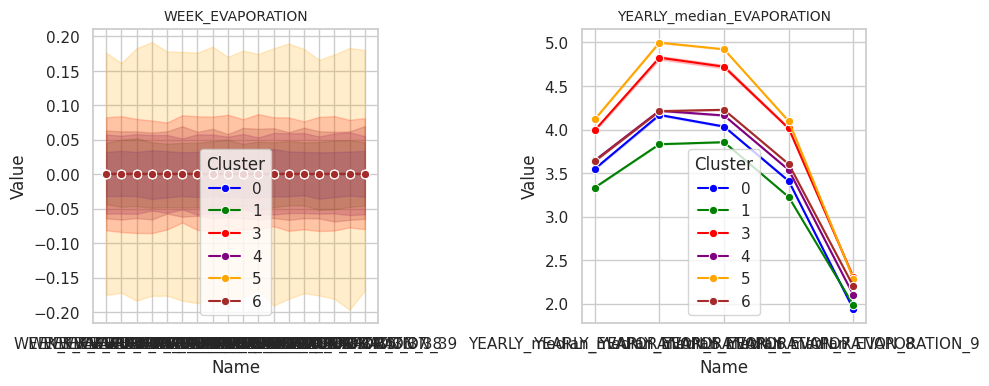

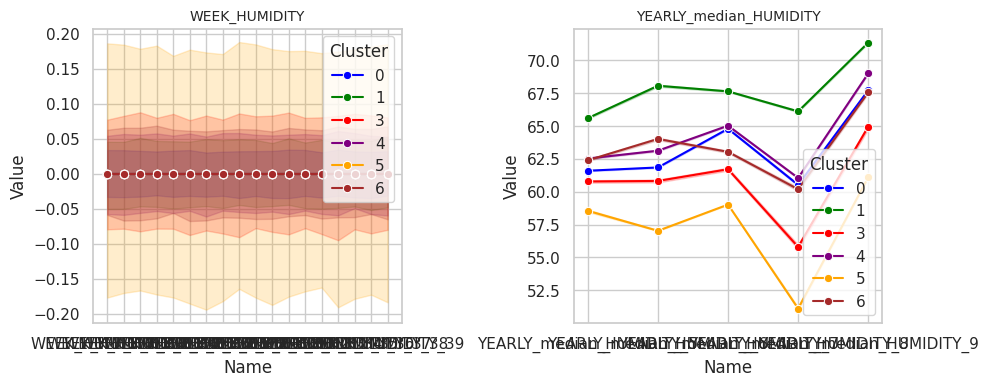

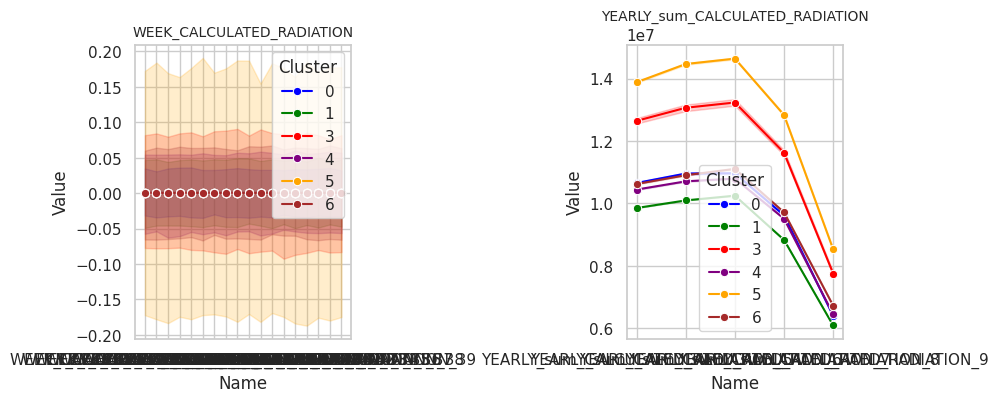

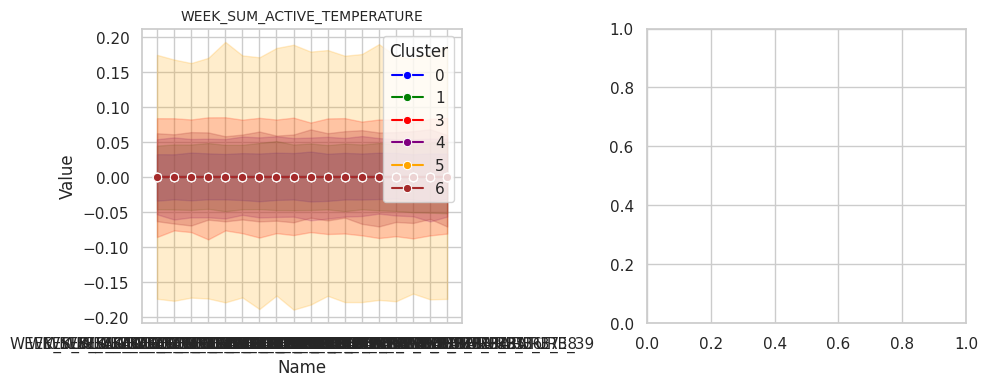

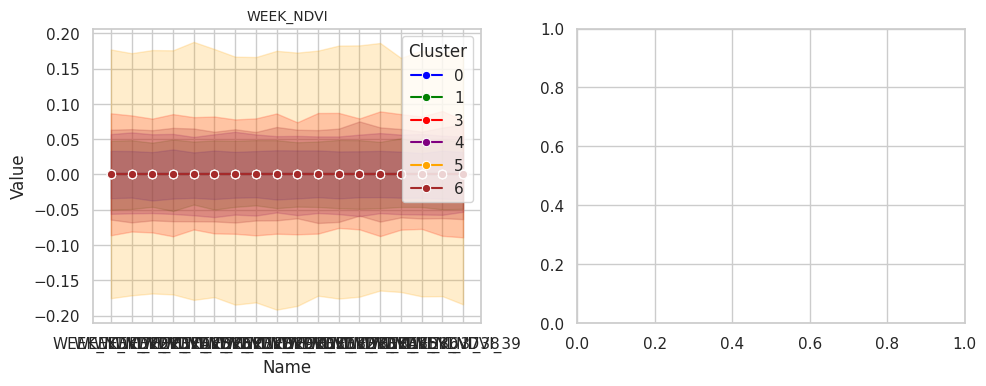

In [15]:
######## VISUALIZE DATASET FOR UNDERSTANDING SCALED DATA ###############################

color_vector = ['blue', 'green', 'red', 'purple', 'orange', 'brown'] #, 'pink']
# color_vector = ['r', 'g', 'b', 'm', 'c', 'y', 'aquamarine']

###### PLOT SCALED WEATHER FOR CLUSTER/GEOZONE ###########               
# show_check = True
if show_check == True:
    ################# PLOT WEATHER ################################
    for ii, feature_name in enumerate(WEEKLY_FEATURE_NAME_LIST):
        fig, ax = plt.subplots(1, 2, figsize=(10, 4))
        axs = ax.flat
        sns.set(style="whitegrid")
        ############# FOR WEEKLY #####################################################
        cols_names = [f'{feature_name}_{x}' for x in range(22, 40)]
        selected_df = original_data[cols_names + ['Cluster']]
        
        # Melt the DataFrame
        melted_df = pd.melt(selected_df, id_vars=['Cluster'], var_name='Name', value_name='Value')    
        
        sns.lineplot(x='Name', y='Value', hue='Cluster', 
                     ax=axs[0], data=melted_df, palette=color_vector, 
                     marker='o').set_title(f'{feature_name}', fontsize=10)
        ############### FOR YEARLY #####################################################   
        if ii < len(YEARLY_FEATURE_NAME_LIST):            
            feature_name = YEARLY_FEATURE_NAME_LIST[ii]
            
            cols_names = [f'{feature_name}_{x}' for x in range(5, 10)]
            selected_df = original_data[cols_names + ['Cluster']]
            
            # Melt the DataFrame
            melted_df = pd.melt(selected_df, id_vars=['Cluster'], var_name='Name', value_name='Value')
            
            sns.lineplot(x='Name', y='Value', hue='Cluster', 
                         ax=axs[1], data=melted_df, palette=color_vector, 
                         marker='o').set_title(f'{feature_name}', fontsize=10)

        fig.tight_layout(pad=1)

/tmp/ipykernel_362452/3367904087.py:40: UserWarning: 
The palette list has fewer values (6) than needed (42) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(


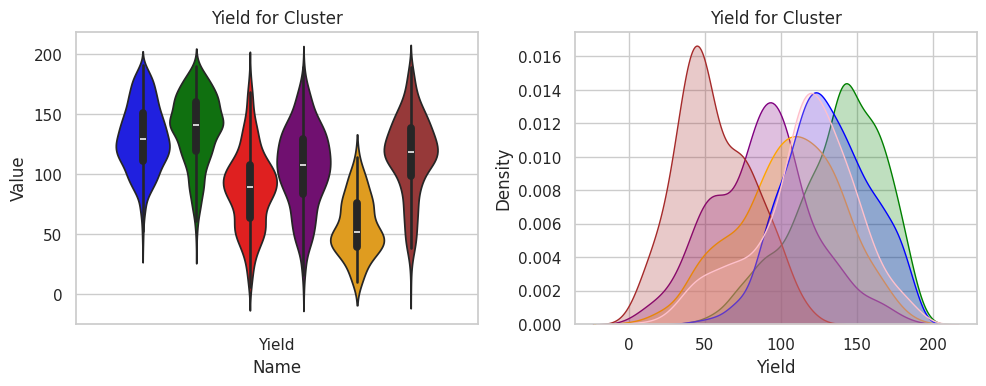

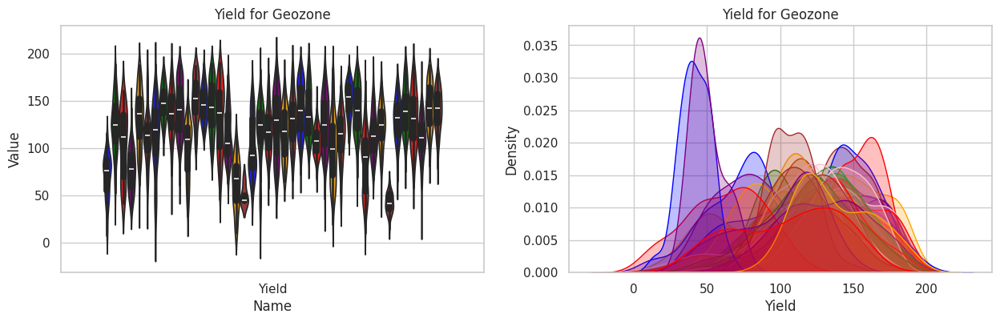

In [16]:
color_vector = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink']

###### PLOT YIELD FOR CLUSTER & GEOZONE ################
# show_check = True
if show_check == True:
    ######################## PLOT YIELD FOR CLUSTER ################
    fix, ax = plt.subplots(1, 2, figsize=(10, 4))
    axs = ax.flat
    ##### FOR YIELD #################
    cols_names = ['Yield']
    selected_df = original_data.loc[(original_data['Dataset'] == 'train'), cols_names + ['Cluster']]
    
    # Melt the DataFrame
    melted_df = pd.melt(selected_df, id_vars=['Cluster'], var_name='Name', value_name='Value')
    
    sns.set(style="whitegrid")
    sns.violinplot(
        data=melted_df, x="Name", y="Value", hue="Cluster", palette=color_vector[0:6], ax=axs[0],  legend=False,
    ).set_title('Yield for Cluster')
    # sns.scatterplot(data=melted_df, x='Name', y='Value', hue='Cluster', ax=ax,  
    #                 palette=color_vector, marker='.', legend=False).set_title(f'{feature_name}', fontsize=10)
    
    for ii in selected_df['Cluster'].unique():
        sns.kdeplot(data=selected_df[ selected_df['Cluster'] == ii ], x='Yield', fill=True, ax=axs[1], color=color_vector[ii]).set_title('Yield for Cluster');

    fix.tight_layout(pad=1)
    ######################## PLOT YIELD FOR GEOZONE ################
    fix, ax = plt.subplots(1, 2, figsize=(15, 4))
    axs = ax.flat
    ##### FOR YIELD #################
    cols_names = ['Yield']
    selected_df = original_data.loc[(original_data['Dataset'] == 'train'), cols_names + ['Geozone']]
    
    # Melt the DataFrame
    melted_df = pd.melt(selected_df, id_vars=['Geozone'], var_name='Name', value_name='Value')

    color_vectors = color_vector * 10 
    
    sns.set(style="whitegrid")
    sns.violinplot(
        data=melted_df, x="Name", y="Value", hue="Geozone", palette=color_vector[0:6], ax=axs[0],  legend=False,
    ).set_title('Yield for Geozone')
    # sns.scatterplot(data=melted_df, x='Name', y='Value', hue='Cluster', ax=ax,  
    #                 palette=color_vector, marker='.', legend=False).set_title(f'{feature_name}', fontsize=10)

    for ii in selected_df['Geozone'].unique():
        sns.kdeplot(data=selected_df[ selected_df['Geozone'] == ii ], x='Yield', fill=True, ax=axs[1], color=color_vectors[ii]).set_title('Yield for Geozone');


In [17]:
#### TODO: CALCULATE _CUMSUM_ FOR WEATHER FEATURES #############################
#### SOME CUMSUMS MAY BE USEFULL WEATHER FEATURE, for stochastic variables such as rainfall, for example

cumsum_data = original_data.copy()

for feature_name in WEEKLY_FEATURE_NAME_LIST:            
    wz_name_columns = cumsum_data.columns[cumsum_data.columns.str.match(f'{feature_name}_\d')]
    cumsum_data[wz_name_columns] = cumsum_data[wz_name_columns].cumsum(axis=1)

display(cumsum_data)

# ###### CHECK&VIZUALIZE CUMSUMS FEATURES ################
# if show_check == True:
#     ###### PLOT WEEKLY ###########
#     fix, ax = plt.subplots(3, 2, figsize=(15, 10))
#     axs = ax.flat
#     for ii, feature_name in enumerate(WEEKLY_FEATURE_NAME_LIST):
#         ##### FOR WEEKLY #################
#         cols_names = [f'cumsum_{feature_name}_{x}' for x in nums_weeks[10:]]
#         # cols_names = [f'cumsum_{feature_name}']
#         selected_df = cumsum_data[cols_names + ['Cluster']]
        
#         # Melt the DataFrame
#         melted_df = pd.melt(selected_df, id_vars=['Cluster'], var_name='Name', value_name='Value')
        
#         # Plot using seaborn lineplot
#         sns.set(style="whitegrid")
#         # cols_names = [f'{feature_name}_{x}' for x in range(32, 40)]
#         sns.lineplot(x='Name', y='Value', hue='Cluster', ax=axs[ii], data=melted_df, palette=color_vector, marker='o').set_title(f'{feature_name}', fontsize=10)


,Dataset,Field,Year,Cluster,Area,Yield,Geozone,Predecessor,FAO,N,...,YEARLY_median_HUMIDITY_5,YEARLY_median_HUMIDITY_6,YEARLY_median_HUMIDITY_7,YEARLY_median_HUMIDITY_8,YEARLY_median_HUMIDITY_9,YEARLY_sum_CALCULATED_RADIATION_5,YEARLY_sum_CALCULATED_RADIATION_6,YEARLY_sum_CALCULATED_RADIATION_7,YEARLY_sum_CALCULATED_RADIATION_8,YEARLY_sum_CALCULATED_RADIATION_9
0,train,1310,2019,1,79.263,129.077355,12,0,320.0,222.330633,...,65.0,67.0,67.0,65.0,71.0,9779661.0,10016516.0,10183113.0,8751805.0,6020978.0
1,train,1315,2018,1,115.484,190.068235,12,0,360.0,202.932162,...,65.0,67.0,67.0,65.0,71.0,9779661.0,10016516.0,10183113.0,8751805.0,6020978.0
2,train,1315,2019,1,83.883,149.674818,12,0,320.0,229.686158,...,65.0,67.0,67.0,65.0,71.0,9779661.0,10016516.0,10183113.0,8751805.0,6020978.0
3,train,1312,2018,1,55.964,181.336145,12,0,360.0,209.345544,...,65.0,67.0,67.0,65.0,71.0,9779661.0,10016516.0,10183113.0,8751805.0,6020978.0
4,train,1312,2019,1,55.965,148.165017,12,0,320.0,204.983972,...,65.0,67.0,67.0,65.0,71.0,9779661.0,10016516.0,10183113.0,8751805.0,6020978.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7913,test,286,2020,6,31.115,0.000000,19,1,360.0,187.876105,...,63.0,64.0,63.0,61.0,68.0,10689032.0,11052625.0,11243224.0,9808771.0,6767632.0
7914,test,305,2020,6,106.814,0.000000,19,1,360.0,192.701593,...,63.0,64.0,63.0,61.0,68.0,10689032.0,11052625.0,11243224.0,9808771.0,6767632.0
7915,test,292,2020,6,64.673,0.000000,19,1,360.0,189.152769,...,63.0,64.0,63.0,61.0,68.0,10689032.0,11052625.0,11243224.0,9808771.0,6767632.0
7916,test,291,2020,6,34.607,0.000000,19,1,360.0,187.967348,...,63.0,64.0,63.0,61.0,68.0,10689032.0,11052625.0,11243224.0,9808771.0,6767632.0


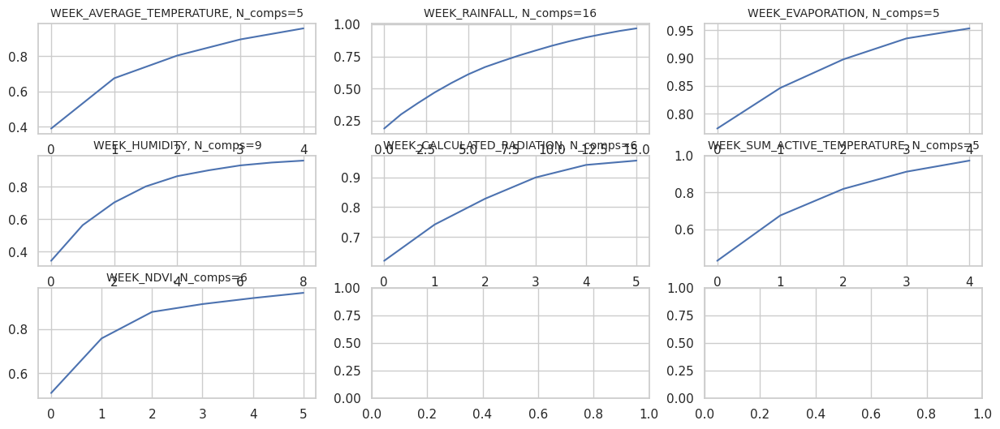

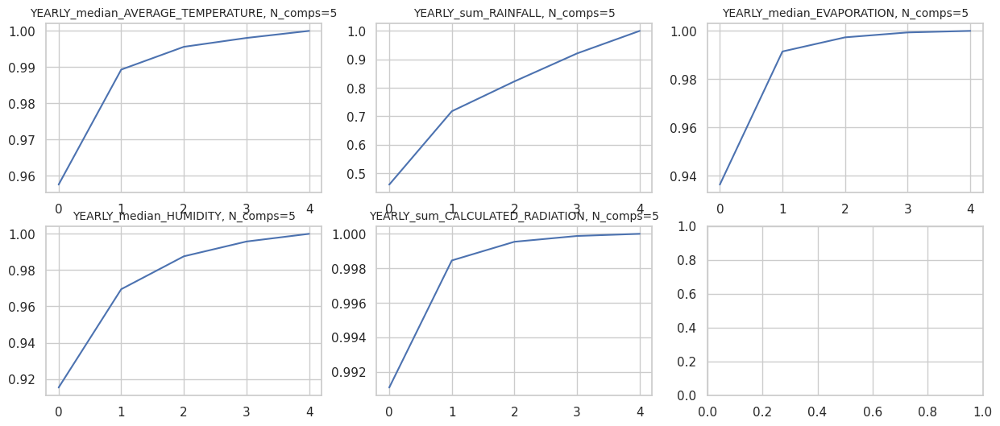

In [18]:
##### EOF(Principal Components) FOR WHOLE DATASET for each wather time series feature #############################
##### usefull for fast checck pipline ####################

###############################################################################      
##### TODO: 1. Discrete Wavelet, Haar‐Wavelets, 2.  Piecewise Aggregate Approximation, 3. Adaptive Piecewise Constant 
##### Explain TODO's: because the growth process of the crops is divided into critical periods, 
#####                 the selection of specific bases function can be more suitable

from sklearn.decomposition import PCA

###### FOR EOF(PCA) DECOMPOSITUION ######################
def get_PCA(data_, ax, feature_name='', threshold=0.95):
    # TODO: Initialize PCA without specifying the number of components
    
    # Standardize the data (mean=0 and variance=1)    
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data_) 
    
    pca = PCA()
    
    # Fit PCA to the data
    pca.fit(scaled_data)
    
    # Determine the number of components based on the explained variance
    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    num_components = np.argmax(cumulative_variance >= threshold) + 1
    
    # Use the determined number of components or set its manualy
    pca = PCA(n_components=num_components)
    principal_components = pca.fit_transform(scaled_data)
    
    if num_components > 1:
        sns.lineplot(data=np.cumsum(pca.explained_variance_ratio_), ax=ax).set_title(f'{feature_name}, N_comps={num_components}', fontsize=10);
    else:
        sns.scatterplot(data=np.cumsum(pca.explained_variance_ratio_), ax=ax).set_title(f'{feature_name}, N_comps={num_components}', fontsize=10);

    columns = [f'PCA_{feature_name}_{i}' for i in range(principal_components.shape[1])]
    return pd.DataFrame(data=principal_components, columns=columns)

######## PCA FOR EACH WEATHER VARIABLES SEPARETELY #######
def get_EOF_DATA(dataset):
    fix, ax = plt.subplots(3, 3, figsize=(15, 6))
    axs = ax.flat

    data = pd.DataFrame([])
    # pc_WEEK_FEATURE_list = []
    for ii, feature_name in enumerate(WEEKLY_FEATURE_NAME_LIST):
        feature_name_columns = dataset.columns[dataset.columns.str.match(f'{feature_name}_\d')]
        data = pd.concat([data, get_PCA(dataset[feature_name_columns], axs[ii], feature_name, threshold=0.95)], axis=1)

    fix, ax = plt.subplots(2, 3, figsize=(15, 6))
    axs = ax.flat
    for ii, feature_name in enumerate(YEARLY_FEATURE_NAME_LIST):
        feature_name_columns = dataset.columns[dataset.columns.str.match(f'{feature_name}_\d')]
        data = pd.concat([data, get_PCA(dataset[feature_name_columns], axs[ii], feature_name, threshold=0.99999999999999)], axis=1)

    return pd.concat([dataset[FEATURE_NAME_LIST], data], axis=1)

pca_data = get_EOF_DATA(ORIGINAL_DATA)



In [19]:
display('PCA Dataset:', pca_data)

'PCA Dataset:'

,Dataset,Field,Year,Cluster,Area,Yield,Geozone,Predecessor,FAO,N,...,PCA_YEARLY_median_HUMIDITY_0,PCA_YEARLY_median_HUMIDITY_1,PCA_YEARLY_median_HUMIDITY_2,PCA_YEARLY_median_HUMIDITY_3,PCA_YEARLY_median_HUMIDITY_4,PCA_YEARLY_sum_CALCULATED_RADIATION_0,PCA_YEARLY_sum_CALCULATED_RADIATION_1,PCA_YEARLY_sum_CALCULATED_RADIATION_2,PCA_YEARLY_sum_CALCULATED_RADIATION_3,PCA_YEARLY_sum_CALCULATED_RADIATION_4
0,train,1310,2019,1,79.263,129.077355,12,0,320.0,222.330633,...,-2.483059,0.230904,0.008368,0.025663,0.048979,-1.939796,0.054281,0.094756,0.004952,-0.037513
1,train,1315,2018,1,115.484,190.068235,12,0,360.0,202.932162,...,-2.483059,0.230904,0.008368,0.025663,0.048979,-1.939796,0.054281,0.094756,0.004952,-0.037513
2,train,1315,2019,1,83.883,149.674818,12,0,320.0,229.686158,...,-2.483059,0.230904,0.008368,0.025663,0.048979,-1.939796,0.054281,0.094756,0.004952,-0.037513
3,train,1312,2018,1,55.964,181.336145,12,0,360.0,209.345544,...,-2.483059,0.230904,0.008368,0.025663,0.048979,-1.939796,0.054281,0.094756,0.004952,-0.037513
4,train,1312,2019,1,55.965,148.165017,12,0,320.0,204.983972,...,-2.483059,0.230904,0.008368,0.025663,0.048979,-1.939796,0.054281,0.094756,0.004952,-0.037513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7921,test,2743,2020,6,30.444,0.000000,25,0,NaN,170.663185,...,0.533855,0.506158,0.540344,-0.299268,-0.105396,-0.447528,0.189057,0.050623,0.080894,0.015611
7922,test,3002,2020,5,102.733,0.000000,42,1,320.0,106.382623,...,3.897435,0.559351,-0.386293,0.801077,-0.325826,9.471569,0.154206,-0.010241,-0.046799,0.130062
7923,test,3000,2020,5,111.347,0.000000,42,1,320.0,100.968073,...,3.897435,0.559351,-0.386293,0.801077,-0.325826,9.471569,0.154206,-0.010241,-0.046799,0.130062
7924,test,3001,2020,5,152.212,0.000000,42,1,320.0,103.299175,...,3.897435,0.559351,-0.386293,0.801077,-0.325826,9.471569,0.154206,-0.010241,-0.046799,0.130062


In [20]:
##### COMBINE FEATURES FROM ORIGINAL, CUMSUM, PCA, AND OTHER FEATUREs DATASET ##########################
##### USEFUL FOR FEATURE IMPORTANCE ##############################

FEATURE_NAME_LIST = ['Dataset', 'Field', 'Year', 'Cluster', 'Area', 'Yield', 'Geozone', 'Predecessor', 'FAO', 'N', 'P', 'K']

WEEKLY_FEATURE_NAME_LIST = ['WEEK_AVERAGE_TEMPERATURE', 'WEEK_RAINFALL', 'WEEK_EVAPORATION', 'WEEK_HUMIDITY', 'WEEK_CALCULATED_RADIATION', 'WEEK_SUM_ACTIVE_TEMPERATURE', 'WEEK_NDVI']

YEARLY_FEATURE_NAME_LIST = ['YEARLY_median_AVERAGE_TEMPERATURE', 'YEARLY_sum_RAINFALL', 'YEARLY_median_EVAPORATION', 'YEARLY_median_HUMIDITY',   'YEARLY_sum_CALCULATED_RADIATION', ]

def get_FEATURE_COLUMNS(df, column_patterns, prefixs = 'PCA_', suff=''):
    prefixed_column_names = [prefixs + name for name in column_patterns]
    
    regex_pattern = '|'.join(prefixed_column_names)
    
    selected_columns = list(df.filter(regex=f'{regex_pattern}_{suff}'))

    FEATURE_COLUMNS = FEATURE_NAME_LIST + selected_columns
    
    return df[FEATURE_COLUMNS].copy()


####### SET FEATURES FOR TRAINING EXPERIMENTS ############################
# column_patterns = ['WEEK_AVERAGE_TEMPERATURE', 'WEEK_RAINFALL', 'WEEK_EVAPORATION', 'WEEK_NDVI']

column_patterns = WEEKLY_FEATURE_NAME_LIST + YEARLY_FEATURE_NAME_LIST

data = pca_data
# data = scaled_data

data_data = get_FEATURE_COLUMNS(data, column_patterns, 'PCA_', )

display('Combined for train Dataset:', data_data)

'Combined for train Dataset:'

,Dataset,Field,Year,Cluster,Area,Yield,Geozone,Predecessor,FAO,N,...,PCA_YEARLY_median_HUMIDITY_0,PCA_YEARLY_median_HUMIDITY_1,PCA_YEARLY_median_HUMIDITY_2,PCA_YEARLY_median_HUMIDITY_3,PCA_YEARLY_median_HUMIDITY_4,PCA_YEARLY_sum_CALCULATED_RADIATION_0,PCA_YEARLY_sum_CALCULATED_RADIATION_1,PCA_YEARLY_sum_CALCULATED_RADIATION_2,PCA_YEARLY_sum_CALCULATED_RADIATION_3,PCA_YEARLY_sum_CALCULATED_RADIATION_4
0,train,1310,2019,1,79.263,129.077355,12,0,320.0,222.330633,...,-2.483059,0.230904,0.008368,0.025663,0.048979,-1.939796,0.054281,0.094756,0.004952,-0.037513
1,train,1315,2018,1,115.484,190.068235,12,0,360.0,202.932162,...,-2.483059,0.230904,0.008368,0.025663,0.048979,-1.939796,0.054281,0.094756,0.004952,-0.037513
2,train,1315,2019,1,83.883,149.674818,12,0,320.0,229.686158,...,-2.483059,0.230904,0.008368,0.025663,0.048979,-1.939796,0.054281,0.094756,0.004952,-0.037513
3,train,1312,2018,1,55.964,181.336145,12,0,360.0,209.345544,...,-2.483059,0.230904,0.008368,0.025663,0.048979,-1.939796,0.054281,0.094756,0.004952,-0.037513
4,train,1312,2019,1,55.965,148.165017,12,0,320.0,204.983972,...,-2.483059,0.230904,0.008368,0.025663,0.048979,-1.939796,0.054281,0.094756,0.004952,-0.037513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7921,test,2743,2020,6,30.444,0.000000,25,0,NaN,170.663185,...,0.533855,0.506158,0.540344,-0.299268,-0.105396,-0.447528,0.189057,0.050623,0.080894,0.015611
7922,test,3002,2020,5,102.733,0.000000,42,1,320.0,106.382623,...,3.897435,0.559351,-0.386293,0.801077,-0.325826,9.471569,0.154206,-0.010241,-0.046799,0.130062
7923,test,3000,2020,5,111.347,0.000000,42,1,320.0,100.968073,...,3.897435,0.559351,-0.386293,0.801077,-0.325826,9.471569,0.154206,-0.010241,-0.046799,0.130062
7924,test,3001,2020,5,152.212,0.000000,42,1,320.0,103.299175,...,3.897435,0.559351,-0.386293,0.801077,-0.325826,9.471569,0.154206,-0.010241,-0.046799,0.130062


In [21]:
######## CREATE & CLEAN TRAIN/TEST DATSETS for NaNs & duplicates, and drop them ###############
#### TODO: NaNs have been identified only in the FAO, P, and K variables, which are related to agricultural practices. 
####       Gap filling can be performed for P and K by using the average values within each Cluster, Geozone. 
####       For FAO, gap filling can be done by using the most common value within the respective Cluster, Geozone. 

train = data_data[ data_data['Dataset'] == 'train' ]
test = data_data[ data_data['Dataset'] == 'test' ]

data_data = []

def check_nan_dupl(df):
    # check for missing values
    print('-----------------------------------------------------------------')
    print(f'Dataset length: {df.shape[0]}\n')

    print(f'There are {int(df.isna().sum().sum())} missing feature values.')

    # Identify columns with NaN values
    nan_columns = train.columns[df.isna().any()]
    print(f'There are NaN column names: {nan_columns}\n')

    # check for duplicate rows
    n_duplicate_rows = len(df) - len(df.drop_duplicates())
    print(f'There are {int(n_duplicate_rows)} duplicate rows.\n')

    df = df.dropna()
    df = df.drop_duplicates()

    # get length of train and test datasets
    print(f'Cleared Dataset length: {df.shape[0]}')
    print('-----------------------------------------------------------------')

    return df

train = check_nan_dupl(train)
test = check_nan_dupl(test)


-----------------------------------------------------------------
Dataset length: 5734

There are 1352 missing feature values.
There are NaN column names: Index(['FAO', 'P', 'K'], dtype='object')

There are 46 duplicate rows.

Cleared Dataset length: 4613
-----------------------------------------------------------------
-----------------------------------------------------------------
Dataset length: 2192

There are 961 missing feature values.
There are NaN column names: Index(['FAO', 'P', 'K'], dtype='object')

There are 0 duplicate rows.

Cleared Dataset length: 1501
-----------------------------------------------------------------


In [22]:
#### for color generation 
import matplotlib.colors as mcolors
import numpy as np
import matplotlib.pyplot as plt

def generate_color_vector(N, majority_color='blue', colormap='viridis'):
    """
    Generate a vector of colors with a majority color using matplotlib.colors.

    Parameters:
    - N: int, dimension of the color vector.
    - majority_color: str or tuple, color code for the majority color.
    - colormap: str, name of the colormap for the other colors.

    Returns:
    - color_vector: list of RGBA values.
    """
    # Create a colormap for the other colors
    cmap = plt.cm.get_cmap(colormap)

    # Generate a vector of colors
    color_vector = [mcolors.to_rgba(majority_color)] * N

    # Add other colors from the colormap
    for i in range(1, N):
        color_vector[i] = cmap(i / (N - 1))

    return color_vector

# Example usage with 45 dimensions, majority color 'blue', and colormap 'viridis'
N_dim = 45
majority_color = 'red'
colormap_name = 'viridis'

colors = generate_color_vector(N_dim, majority_color, colormap_name)

/tmp/ipykernel_362452/4074330017.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap(colormap)


/tmp/ipykernel_362452/2240098119.py:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=train[ train['Geozone'] == ii ], x='Yield', fill=True, ax=axs[1], color=colors[ii]).set_title('Yield for Geozones');


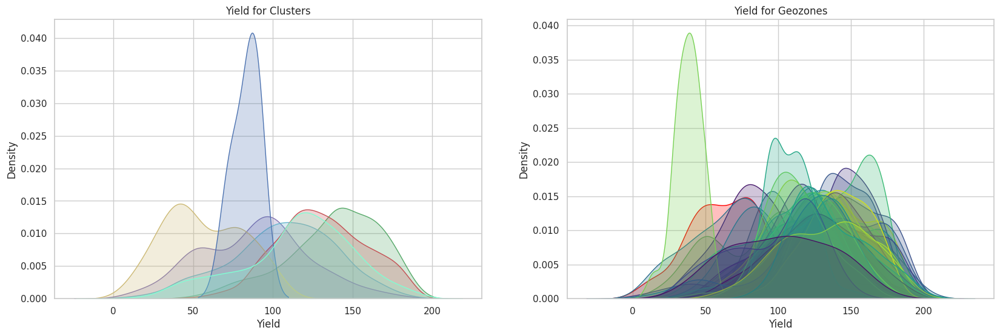

In [23]:
#### CHECK YIELD DISTRIBUTION FOR EACH CLUSTER ###################
colors_clusters = ['r', 'g', 'b', 'm', 'c', 'y', 'aquamarine']

fix, ax = plt.subplots(1, 2, figsize=(20, 6))
axs = ax.flat

for ii in train['Cluster'].unique():
    sns.kdeplot(data=train[ train['Cluster'] == ii ], x='Yield', fill=True, ax=axs[0], color=colors_clusters[ii]).set_title('Yield for Clusters');
axs[0].grid(visible=True)

# fix, ax = plt.subplots(figsize=(6, 6))
for ii in train['Geozone'].unique():
    sns.kdeplot(data=train[ train['Geozone'] == ii ], x='Yield', fill=True, ax=axs[1], color=colors[ii]).set_title('Yield for Geozones');
axs[1].grid(visible=True)

/tmp/ipykernel_362452/3336311597.py:12: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df_f, x=f'Yield', fill=True, ax=axs[jj], color=colors[ii]).set_title(f'Clust: {jj}; Geos: {num_geozone}, Fields: {df.shape[0]}')


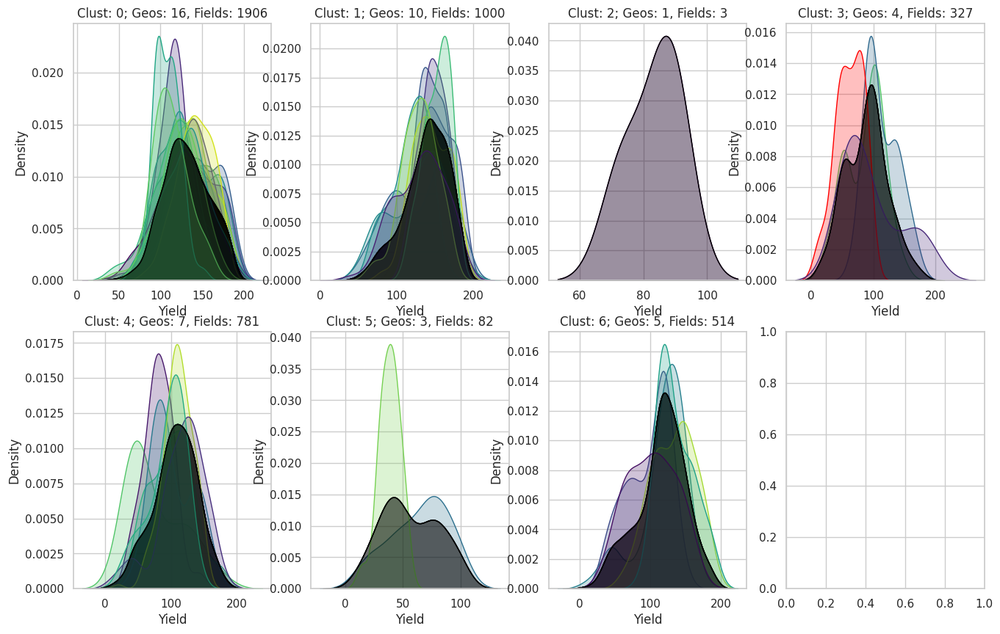

In [24]:
##### CHECK YIELD DISTRIBUTION FOR EACH GEOZONE For EACH CLUSTER #################
# colors = ['r', 'g', 'b', 'm', 'c', 'y', 'aquamarine']

fix, ax = plt.subplots(2, 4, figsize=(16, 10))
axs = ax.flat
for jj in train['Cluster'].unique():
  df = train[ train['Cluster'] == jj ]
  num_geozone = len(df['Geozone'].unique())
  for ii in df['Geozone'].unique():
      df_f = df[ df['Geozone'] == ii ]
      # print('Cluster:', jj, 'Geozone:', ii, 'Fields', df_f.shape[0])
      sns.kdeplot(data=df_f, x=f'Yield', fill=True, ax=axs[jj], color=colors[ii]).set_title(f'Clust: {jj}; Geos: {num_geozone}, Fields: {df.shape[0]}')
      sns.kdeplot(data=df, x='Yield', fill=True, ax=axs[jj], color='black') #.set_title('Target Distribution on Train Set');
  axs[jj].grid(visible=True)


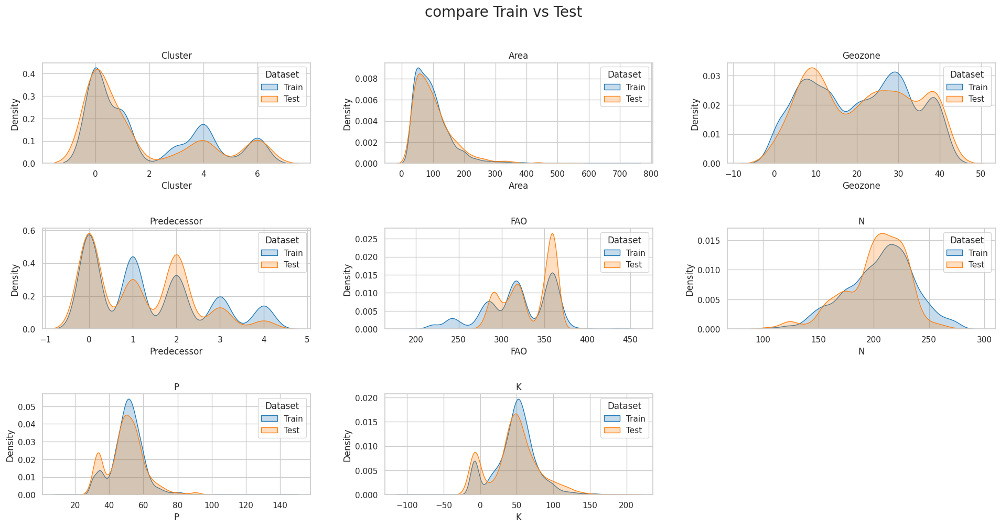

In [25]:
####### COMPARE TRAIN vs TEST DISTRIBUTION ###################################
# features = ['Field', 'Cluster', 'Area', 'Geozone', 'Predecessor', 'FAO', 'N_kg/ga', 'P_kg/ga', 'K_kg/ga']
features = ['Cluster', 'Area', 'Geozone', 'Predecessor', 'FAO', 'N', 'P', 'K']

# plotting distribution of each continuous feature in train and test datasets
fig, ax = plt.subplots(6, 3, figsize=(20, 20))
ax = np.ravel(ax)
palette = sns.color_palette('tab10', 2)

for i, col in enumerate(features):
    sns.kdeplot(data=train, x=train[col], ax=ax[i], label='Train', color=palette[0], fill=True)
    sns.kdeplot(data=test, x=test[col], ax=ax[i], label='Test', color=palette[1], fill=True)
    ax[i].set_title(f'{col}', fontsize=12)
    ax[i].legend(title='Dataset', loc='upper right', labels=['Train', 'Test'])

fig.suptitle('compare Train vs Test', fontsize=20);
fig.tight_layout(pad=3)
for i in range(len(ax)): # hiding any unused axes
    if i >= len(features):
        ax[i].set_visible(False)

There are 11 extreme outliers in the P _kg/ga feature in the training set.
There are 0 extreme outliers in the P _kg/ga feature in the submission set.

There are 457 extreme outliers in the K _kg/ga feature in the training set.
There are 260 extreme outliers in the K _kg/ga feature in the submission set.



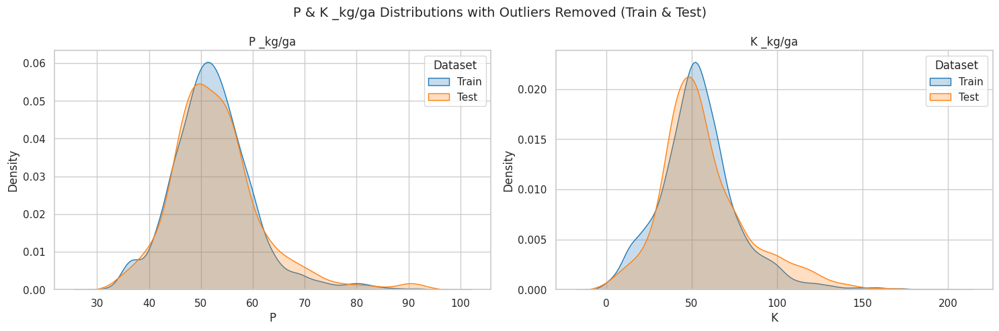

In [26]:
####### CLEANING EXTREAM OUTLIERS #########################
# checking for extreme P & K outliers

P_threshold = 100
n_P_exceeding_train = len(train[train['P'] >= P_threshold])
n_P_exceeding_test = len(test[test['P'] >= P_threshold])
print(f'There are {n_P_exceeding_train} extreme outliers in the P _kg/ga feature in the training set.')
print(f'There are {n_P_exceeding_test} extreme outliers in the P _kg/ga feature in the submission set.\n')

temp_train = train[train['P'] < P_threshold]
temp_test = test[test['P'] < P_threshold]

# checking for extreme K outliers
K_threshold = 0
n_K_exceeding_train = len(temp_train[temp_train['K'] <= K_threshold])
n_K_exceeding_test = len(temp_test[temp_test['K'] <= K_threshold])
print(f'There are {n_K_exceeding_train} extreme outliers in the K _kg/ga feature in the training set.')
print(f'There are {n_K_exceeding_test} extreme outliers in the K _kg/ga feature in the submission set.\n')

temp_train = temp_train[temp_train['K'] > K_threshold]
temp_test = temp_test[temp_test['K'] > K_threshold]

# plotting distribution of each continuous feature in train and test datasets
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax = np.ravel(ax)
palette = sns.color_palette('tab10', 2)

sns.kdeplot(data=temp_train, x=temp_train['P'], ax=ax[0], label='Train', color=palette[0], fill=True)
sns.kdeplot(data=temp_test, x=temp_test['P'], ax=ax[0], label='Test', color=palette[1], fill=True)
ax[0].set_title(f'P _kg/ga', fontsize=12)
ax[0].legend(title='Dataset', loc='upper right', labels=['Train', 'Test'])

sns.kdeplot(data=temp_train, x=temp_train['K'], ax=ax[1], label='Train', color=palette[0], fill=True)
sns.kdeplot(data=temp_test, x=temp_test['K'], ax=ax[1], label='Test', color=palette[1], fill=True)
ax[1].set_title(f'K _kg/ga', fontsize=12)
ax[1].legend(title='Dataset', loc='upper right', labels=['Train', 'Test'])

fig.suptitle('P & K _kg/ga Distributions with Outliers Removed (Train & Test)', fontsize=14);
fig.tight_layout(pad=1)

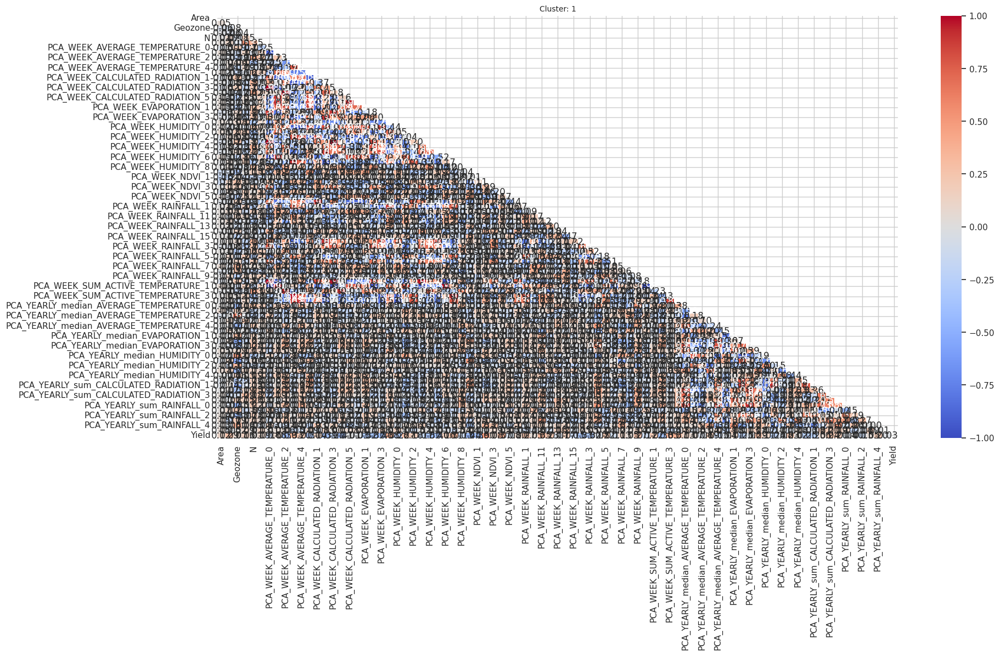

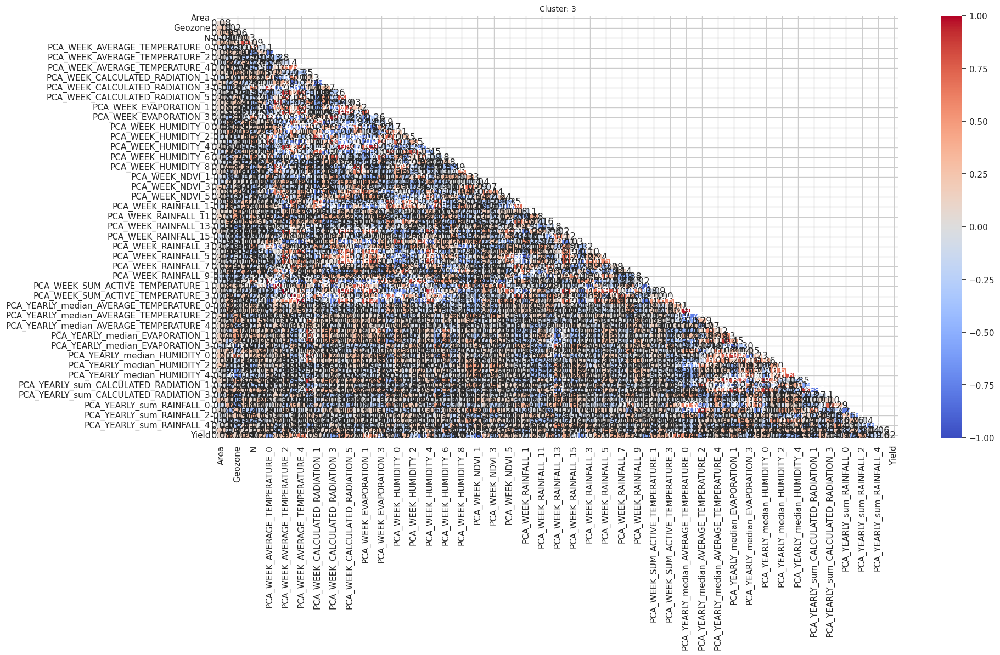

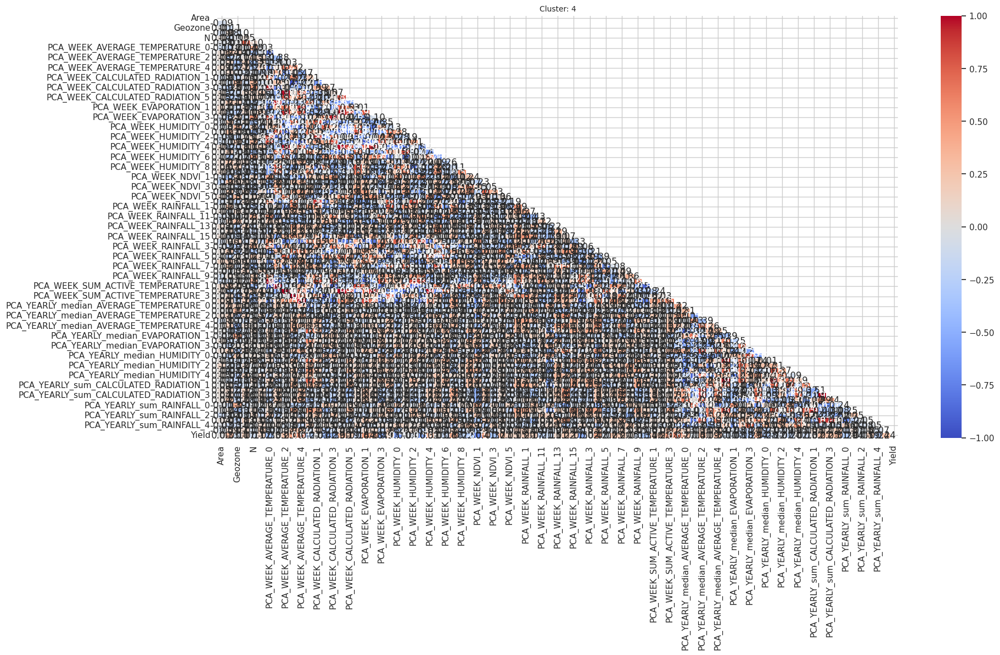

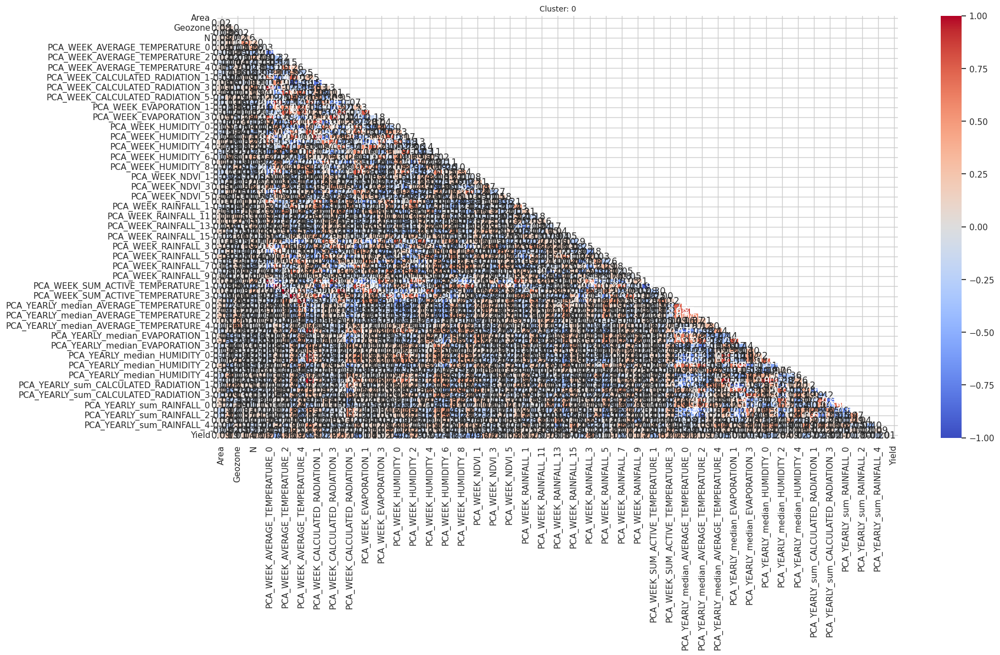

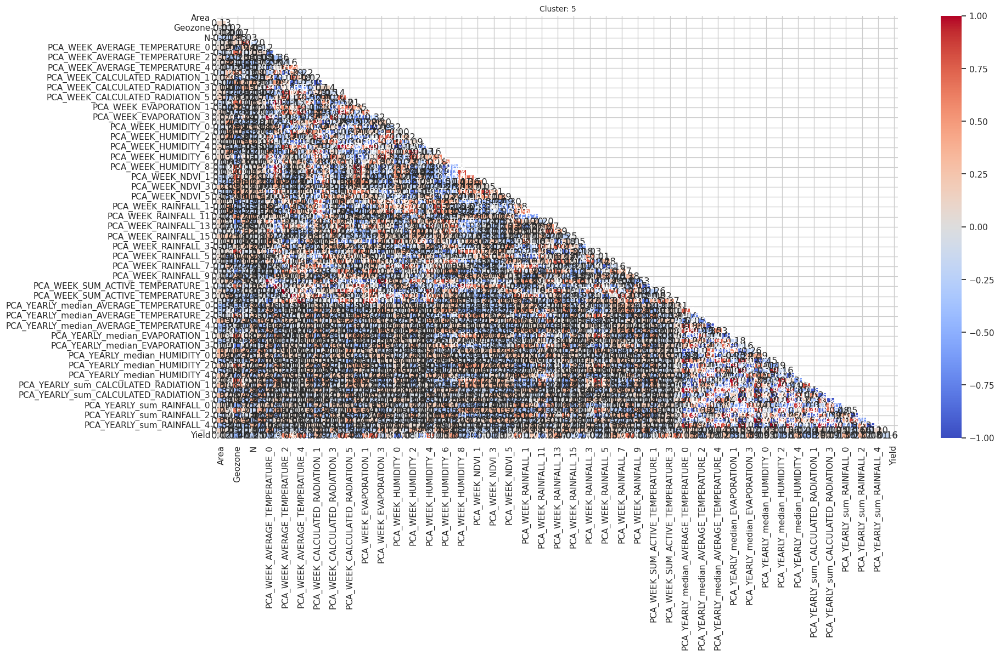

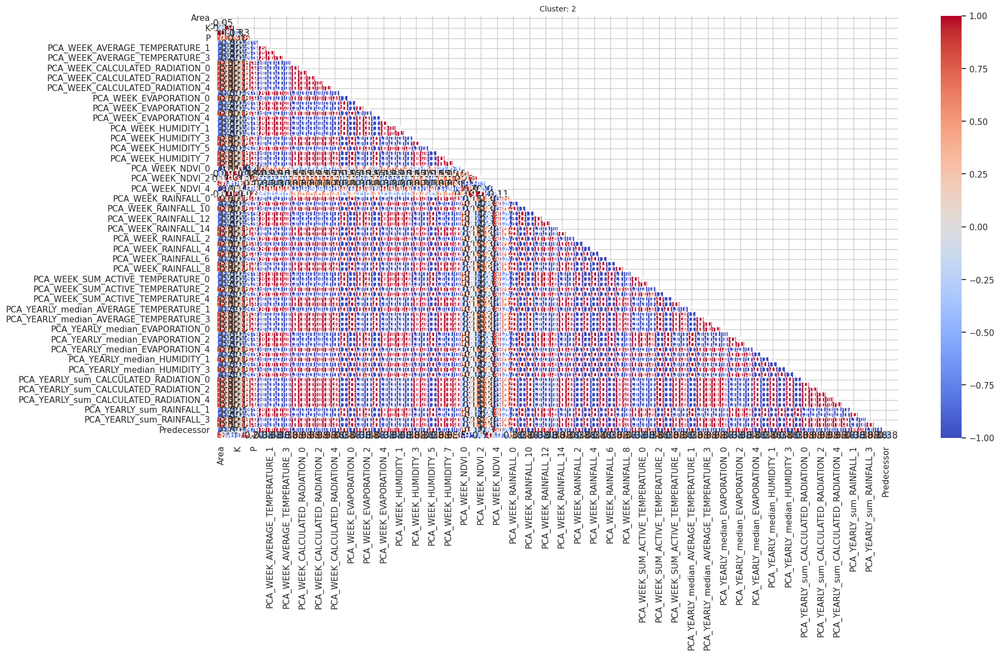

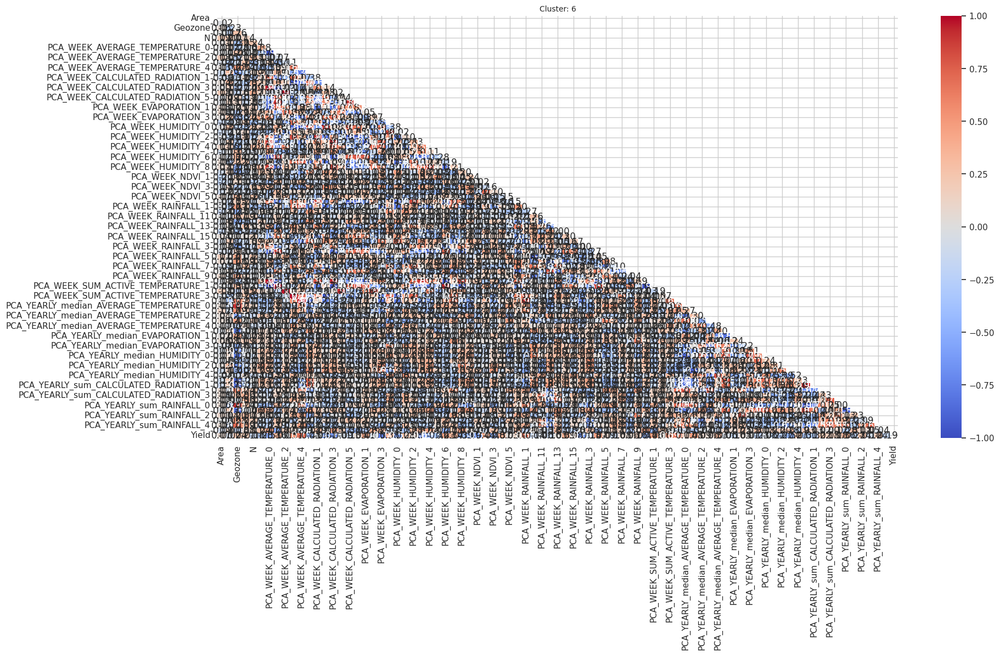

In [27]:
####### CHECK TRAIN DATASET CORRELATION MATRIX ##############################

def CorrMatr(df, corr_threshold = 0.0):

    # # calculating the raw correlation matrix
    raw_correlation = df.corr()

    # only keeping the lower diagonal
    correlation = raw_correlation.copy()
    mask = np.zeros_like(correlation, dtype=bool)
    mask[np.triu_indices_from(mask)] = True
    correlation[mask] = np.nan

    # function to filter the correlation matrix by features that have correlation values above a certain threshold
    def correlation_threshold_filter(df, threshold):
        passed = set()
        for r, c in combinations(df.columns, 2):
            if (abs(df.loc[r, c]) >= threshold):
                passed.add(r)
                passed.add(c)
        passed = sorted(passed)
        return df.loc[passed, passed]


    correlation = correlation_threshold_filter(raw_correlation, 0.0)

    # only keeping the lower diagonal
    mask = np.zeros_like(correlation, dtype=bool)
    mask[np.triu_indices_from(mask)] = True
    correlation[mask] = np.nan

    return correlation

features = temp_train.columns
# print(features)

feature_to_exclude = ['Dataset', 'Field', 'Year', 'Yield']
corr_fetures_list = [item for item in list(features) if item not in feature_to_exclude]


#### DROP BAD CLUSTER 2 ################
# temp_train = temp_train[ temp_train['Cluster'] != 2 ]

for ii in temp_train['Cluster'].unique():
    filtered_df = temp_train.loc[(temp_train['Cluster'] == ii), corr_fetures_list + ['Yield']]

    corr_threshold = 0.5
    correlation = CorrMatr(filtered_df, corr_threshold)

    fig, ax = plt.subplots(1, 1 , figsize=(20, 10))
    sns.heatmap(correlation, annot=True, fmt='0.2f', cmap='coolwarm', ax=ax, vmin=-1, vmax=1).set_title(f'Cluster: {ii}', fontsize=10);


In [28]:
########## SETUP & EXPERIMENT WITH CATEGORICAL FEATURES ###############################

train = []
test = []

data_data = pd.concat([temp_train, temp_test], axis=0)

temp_train = []
temp_test = []

###############################################################
# display(data_data)
###### SETUP CATEGORICAL COLUMNS ####################

data_data['Cluster'] = pd.Categorical(data_data['Cluster'], categories=data_data['Cluster'].unique())
data_data['Geozone'] = pd.Categorical(data_data['Geozone'], categories=data_data['Geozone'].unique())
data_data['Predecessor'] = pd.Categorical(data_data['Predecessor'], categories=data_data['Predecessor'].unique())

######## SETUP CAT_FEATURES, need for CatBoost ##########################
cat_features=['Cluster', 'Geozone', 'Predecessor']
# cat_features=['Cluster', 'Geozone']
# cat_features=['Geozone']


######### CHECK DATASET FOR CATEGORICAL ################################
display(data_data)

# Display all column names and their data types
column_info = data_data.dtypes.reset_index()
column_info.columns = ['Column Name', 'Data Type']

# Check if each column is categorical or not
column_info['Is Categorical'] = column_info['Data Type'].astype(str).str.startswith('category')

display(column_info[0:20])

# fn

,Dataset,Field,Year,Cluster,Area,Yield,Geozone,Predecessor,FAO,N,...,PCA_YEARLY_median_HUMIDITY_0,PCA_YEARLY_median_HUMIDITY_1,PCA_YEARLY_median_HUMIDITY_2,PCA_YEARLY_median_HUMIDITY_3,PCA_YEARLY_median_HUMIDITY_4,PCA_YEARLY_sum_CALCULATED_RADIATION_0,PCA_YEARLY_sum_CALCULATED_RADIATION_1,PCA_YEARLY_sum_CALCULATED_RADIATION_2,PCA_YEARLY_sum_CALCULATED_RADIATION_3,PCA_YEARLY_sum_CALCULATED_RADIATION_4
0,train,1310,2019,1,79.263,129.077355,12,0,320.0,222.330633,...,-2.483059,0.230904,0.008368,0.025663,0.048979,-1.939796,0.054281,0.094756,0.004952,-0.037513
1,train,1315,2018,1,115.484,190.068235,12,0,360.0,202.932162,...,-2.483059,0.230904,0.008368,0.025663,0.048979,-1.939796,0.054281,0.094756,0.004952,-0.037513
2,train,1315,2019,1,83.883,149.674818,12,0,320.0,229.686158,...,-2.483059,0.230904,0.008368,0.025663,0.048979,-1.939796,0.054281,0.094756,0.004952,-0.037513
3,train,1312,2018,1,55.964,181.336145,12,0,360.0,209.345544,...,-2.483059,0.230904,0.008368,0.025663,0.048979,-1.939796,0.054281,0.094756,0.004952,-0.037513
4,train,1312,2019,1,55.965,148.165017,12,0,320.0,204.983972,...,-2.483059,0.230904,0.008368,0.025663,0.048979,-1.939796,0.054281,0.094756,0.004952,-0.037513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7920,test,291,2020,6,34.607,0.000000,19,1,360.0,187.967348,...,0.308179,0.732161,0.467851,0.066768,-0.214315,0.437461,0.281568,0.052047,0.036615,0.042547
7922,test,3002,2020,5,102.733,0.000000,42,1,320.0,106.382623,...,3.897435,0.559351,-0.386293,0.801077,-0.325826,9.471569,0.154206,-0.010241,-0.046799,0.130062
7923,test,3000,2020,5,111.347,0.000000,42,1,320.0,100.968073,...,3.897435,0.559351,-0.386293,0.801077,-0.325826,9.471569,0.154206,-0.010241,-0.046799,0.130062
7924,test,3001,2020,5,152.212,0.000000,42,1,320.0,103.299175,...,3.897435,0.559351,-0.386293,0.801077,-0.325826,9.471569,0.154206,-0.010241,-0.046799,0.130062


,Column Name,Data Type,Is Categorical
0,Dataset,object,False
1,Field,int64,False
2,Year,int64,False
3,Cluster,category,True
4,Area,float64,False
5,Yield,float64,False
6,Geozone,category,True
7,Predecessor,category,True
8,FAO,float64,False
9,N,float64,False


In [29]:
######## SPLIT TRAIN/TEST FROM TRAIN DATASET FOR TRAIN & CROSS_VALIDATION ###################################
train = data_data[ data_data['Dataset'] == 'train' ]

submission = data_data[ data_data['Dataset'] == 'test' ]

target_name = 'Yield'
features_to_exclude = ['Dataset', 'Field', 'Year'] + [target_name]

all_features = list(train.columns)
features_to_include = list(set(all_features) - set(features_to_exclude))

# ################## submission dataset #############
# sub_title  = submission[['Dataset', 'Field', 'Year']]
# # submission = submission[features_to_include]

print(f'all_features: {len(all_features)} : {all_features}')
print(f'features_to_exclude: {len(features_to_exclude)} : {features_to_exclude}')
print(f'features_to_include: {len(features_to_include)} : {features_to_include}')

# splitting training data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(train[features_to_include],
                                                    train[[target_name]],
                                                    train_size=0.80,
                                                    shuffle=True,
                                                    random_state=1)

print(f'Size of X_train: {X_train.shape}\nSize of y_train: {y_train.shape}')
print(f'Size of X_test: {X_test.shape}\nSize of y_test: {y_test.shape}')

all_features: 89 : ['Dataset', 'Field', 'Year', 'Cluster', 'Area', 'Yield', 'Geozone', 'Predecessor', 'FAO', 'N', 'P', 'K', 'PCA_WEEK_AVERAGE_TEMPERATURE_0', 'PCA_WEEK_AVERAGE_TEMPERATURE_1', 'PCA_WEEK_AVERAGE_TEMPERATURE_2', 'PCA_WEEK_AVERAGE_TEMPERATURE_3', 'PCA_WEEK_AVERAGE_TEMPERATURE_4', 'PCA_WEEK_RAINFALL_0', 'PCA_WEEK_RAINFALL_1', 'PCA_WEEK_RAINFALL_2', 'PCA_WEEK_RAINFALL_3', 'PCA_WEEK_RAINFALL_4', 'PCA_WEEK_RAINFALL_5', 'PCA_WEEK_RAINFALL_6', 'PCA_WEEK_RAINFALL_7', 'PCA_WEEK_RAINFALL_8', 'PCA_WEEK_RAINFALL_9', 'PCA_WEEK_RAINFALL_10', 'PCA_WEEK_RAINFALL_11', 'PCA_WEEK_RAINFALL_12', 'PCA_WEEK_RAINFALL_13', 'PCA_WEEK_RAINFALL_14', 'PCA_WEEK_RAINFALL_15', 'PCA_WEEK_EVAPORATION_0', 'PCA_WEEK_EVAPORATION_1', 'PCA_WEEK_EVAPORATION_2', 'PCA_WEEK_EVAPORATION_3', 'PCA_WEEK_EVAPORATION_4', 'PCA_WEEK_HUMIDITY_0', 'PCA_WEEK_HUMIDITY_1', 'PCA_WEEK_HUMIDITY_2', 'PCA_WEEK_HUMIDITY_3', 'PCA_WEEK_HUMIDITY_4', 'PCA_WEEK_HUMIDITY_5', 'PCA_WEEK_HUMIDITY_6', 'PCA_WEEK_HUMIDITY_7', 'PCA_WEEK_HUMIDITY

In [30]:
############# START WITH XGBoost BASELINE WITH RANDOM_NOISE FOR REMOVE NOISY FEATURES, wwith low impact #####################
X_baseline = X_train
y_baseline = y_train

################## FOR CUT LOW IMPORTANCE FEATURES ####################
X_baseline['random_noise'] = np.random.normal(size=X_train.shape[0])

# create a baseline model to compare with
baseline_model = XGBRegressor(gamma=5, reg_lambda=5, enable_categorical=True, max_cat_to_onehot=7) # quickly add in some regularization by trial and error to prevent extreme overfitting
# cv_results = cross_validate(baseline_model, X_baseline, y_baseline, cv=10, scoring='neg_mean_absolute_error', return_train_score=True)
cv_results = cross_validate(baseline_model, X_baseline, y_baseline, cv=10, scoring='r2', return_train_score=True)
mean_test_score = np.mean(cv_results['test_score'])
train_test_score_rmse = np.sqrt(np.sum((cv_results['test_score'] - cv_results['train_score']) ** 2) / cv_results['test_score'].shape[0]) # helpful for minimizing overfitting

# print scoring metrics
print(f'Test Scores on K-Folds: ', str(np.round(cv_results['test_score'], decimals=3)))
print(f'Train Scores on K-Folds: ', str(np.round(cv_results['train_score'], decimals=3)))
print(f'Mean Test Score: {np.round(mean_test_score, decimals=3)}')
print(f'Train/Test Score MAPE: {np.round(train_test_score_rmse, decimals=3)}')

Test Scores on K-Folds:  [0.75  0.79  0.818 0.764 0.776 0.839 0.766 0.75  0.802 0.796]
Train Scores on K-Folds:  [0.994 0.994 0.994 0.996 0.994 0.994 0.994 0.994 0.994 0.994]
Mean Test Score: 0.785
Train/Test Score MAPE: 0.211


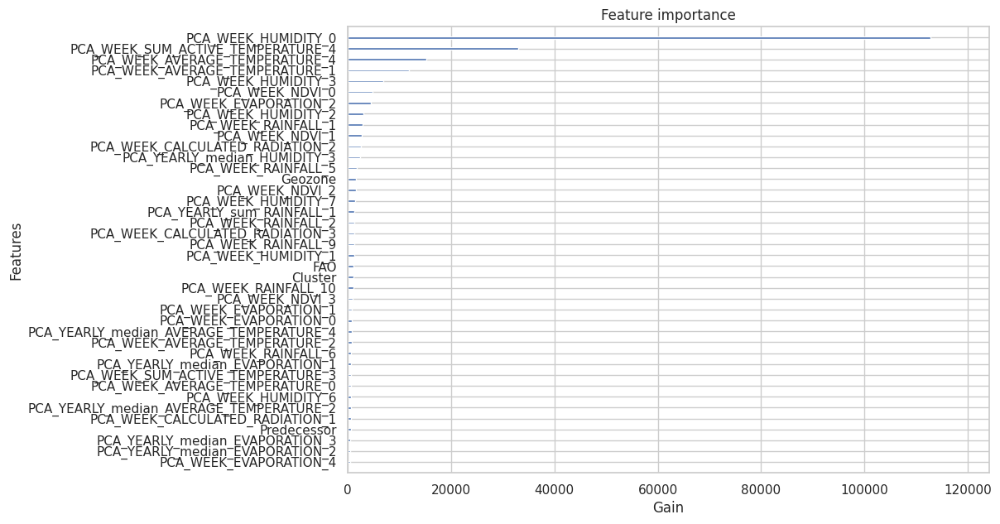

In [31]:
############ PLOT FEATURES IMPORTANSE WITH RANDOM_NOISE #########################
fig, ax = plt.subplots(figsize=(10, 7))
baseline_model.fit(X_baseline, y_baseline)
plot_importance(baseline_model, ax=ax, importance_type='gain', show_values=False, xlabel='Gain', max_num_features=40);

In [32]:
##### DROP FEATURES WITH IMPORTANCE LOWER THAN RANDOM NOISE #################################

importance_dict = baseline_model.get_booster().get_score(importance_type='gain')

# Sort the dictionary by values in descending order
importance_dict = dict(sorted(importance_dict.items(), key=lambda item: item[1], reverse=True))

print(importance_dict)

# Specify the random_noise value
random_noise_value = importance_dict.get('random_noise')  

# Remove keys with values less than random_noise_value
filtered_dict = {key: value for key, value in importance_dict.items() if value > random_noise_value}     

# Display the filtered dictionary
print("Filtered Dictionary:")
print(filtered_dict)

# fn

{'PCA_WEEK_HUMIDITY_0': 112822.03125, 'PCA_WEEK_SUM_ACTIVE_TEMPERATURE_4': 32972.1015625, 'PCA_WEEK_AVERAGE_TEMPERATURE_4': 15164.9970703125, 'PCA_WEEK_AVERAGE_TEMPERATURE_1': 11924.05078125, 'PCA_WEEK_HUMIDITY_3': 6941.1484375, 'PCA_WEEK_NDVI_0': 4769.42236328125, 'PCA_WEEK_EVAPORATION_2': 4567.00048828125, 'PCA_WEEK_HUMIDITY_2': 3085.9267578125, 'PCA_WEEK_RAINFALL_1': 2948.36669921875, 'PCA_WEEK_NDVI_1': 2697.6962890625, 'PCA_WEEK_CALCULATED_RADIATION_2': 2628.908203125, 'PCA_YEARLY_median_HUMIDITY_3': 2443.5712890625, 'PCA_WEEK_RAINFALL_5': 1809.90576171875, 'Geozone': 1652.8233642578125, 'PCA_WEEK_NDVI_2': 1616.80029296875, 'PCA_WEEK_HUMIDITY_7': 1392.4501953125, 'PCA_YEARLY_sum_RAINFALL_1': 1310.8575439453125, 'PCA_WEEK_RAINFALL_2': 1282.3450927734375, 'PCA_WEEK_CALCULATED_RADIATION_3': 1282.177490234375, 'PCA_WEEK_RAINFALL_9': 1236.510498046875, 'PCA_WEEK_HUMIDITY_1': 1225.682373046875, 'FAO': 1123.1895751953125, 'Cluster': 1122.26513671875, 'PCA_WEEK_RAINFALL_10': 1110.603881835

In [33]:
# GET FEATURES FROM FILTERED IMPORTANCE DICT ###################################
features_to_include = list(filtered_dict.keys())

# ###### MANUALY DROP additional FEATURES for experimenting ######################
# manual_to_exclude =   ['PCA_WEEK_RAINFALL_1', 'PCA_WEEK_NDVI_1']
# features_to_include = list(set(features_to_include) - set(manual_to_exclude))
# ################################################################################

print(f'all_features: {len(all_features)} : {all_features}')
print('----------------')
print(f'features_to_exclude: {len(features_to_exclude)} : {features_to_exclude}')
print('----------------')
print(f'features_to_include: {len(features_to_include)} : {features_to_include}')
print('----------------')
print(f'Target: {target_name}')
print('----------------')

################## submission dataset #############
sub_title  = submission[['Dataset', 'Field', 'Year']]
submission = submission[features_to_include]

X_train, X_test, y_train, y_test = train_test_split(train[features_to_include],
                                                    train[target_name],
                                                    train_size=0.80,
                                                    shuffle=True,
                                                    random_state=1)

print(f'Size of X_train: {X_train.shape}\nSize of y_train: {y_train.shape}')
print(f'Size of X_test: {X_test.shape}\nSize of y_test: {y_test.shape}')

all_features: 89 : ['Dataset', 'Field', 'Year', 'Cluster', 'Area', 'Yield', 'Geozone', 'Predecessor', 'FAO', 'N', 'P', 'K', 'PCA_WEEK_AVERAGE_TEMPERATURE_0', 'PCA_WEEK_AVERAGE_TEMPERATURE_1', 'PCA_WEEK_AVERAGE_TEMPERATURE_2', 'PCA_WEEK_AVERAGE_TEMPERATURE_3', 'PCA_WEEK_AVERAGE_TEMPERATURE_4', 'PCA_WEEK_RAINFALL_0', 'PCA_WEEK_RAINFALL_1', 'PCA_WEEK_RAINFALL_2', 'PCA_WEEK_RAINFALL_3', 'PCA_WEEK_RAINFALL_4', 'PCA_WEEK_RAINFALL_5', 'PCA_WEEK_RAINFALL_6', 'PCA_WEEK_RAINFALL_7', 'PCA_WEEK_RAINFALL_8', 'PCA_WEEK_RAINFALL_9', 'PCA_WEEK_RAINFALL_10', 'PCA_WEEK_RAINFALL_11', 'PCA_WEEK_RAINFALL_12', 'PCA_WEEK_RAINFALL_13', 'PCA_WEEK_RAINFALL_14', 'PCA_WEEK_RAINFALL_15', 'PCA_WEEK_EVAPORATION_0', 'PCA_WEEK_EVAPORATION_1', 'PCA_WEEK_EVAPORATION_2', 'PCA_WEEK_EVAPORATION_3', 'PCA_WEEK_EVAPORATION_4', 'PCA_WEEK_HUMIDITY_0', 'PCA_WEEK_HUMIDITY_1', 'PCA_WEEK_HUMIDITY_2', 'PCA_WEEK_HUMIDITY_3', 'PCA_WEEK_HUMIDITY_4', 'PCA_WEEK_HUMIDITY_5', 'PCA_WEEK_HUMIDITY_6', 'PCA_WEEK_HUMIDITY_7', 'PCA_WEEK_HUMIDITY

In [34]:
#### CHECK IMPROVEMENTS WITH DROPPED LOW IMPORTANCE FEATURES ###################
# get train and test data
X_baseline = X_train
y_baseline = y_train

# analyze baseline model with refined data
# cv_results = cross_validate(baseline_model, X_baseline, y_baseline, cv=10, scoring='neg_mean_absolute_error', return_train_score=True)
cv_results = cross_validate(baseline_model, X_baseline, y_baseline, cv=10, scoring='r2', return_train_score=True)
mean_test_score = np.mean(cv_results['test_score'])
train_test_score_rmse = np.sqrt(np.sum((cv_results['test_score'] - cv_results['train_score']) ** 2) / cv_results['test_score'].shape[0]) # helpful for minimizing overfitting

# print scoring metrics
print('Test Scores on K-Folds: ', str(np.round(cv_results['test_score'], decimals=3)))
print('Train Scores on K-Folds: ', str(np.round(cv_results['train_score'], decimals=3)))
print(f'Mean Test Score: {np.round(mean_test_score, decimals=3)}')
print(f'Train/Test Score K-Fold RMSE: {np.round(train_test_score_rmse, decimals=3)}')

Test Scores on K-Folds:  [0.755 0.785 0.841 0.781 0.781 0.848 0.787 0.753 0.8   0.799]
Train Scores on K-Folds:  [0.995 0.993 0.994 0.993 0.993 0.994 0.993 0.993 0.994 0.993]
Mean Test Score: 0.793
Train/Test Score K-Fold RMSE: 0.203


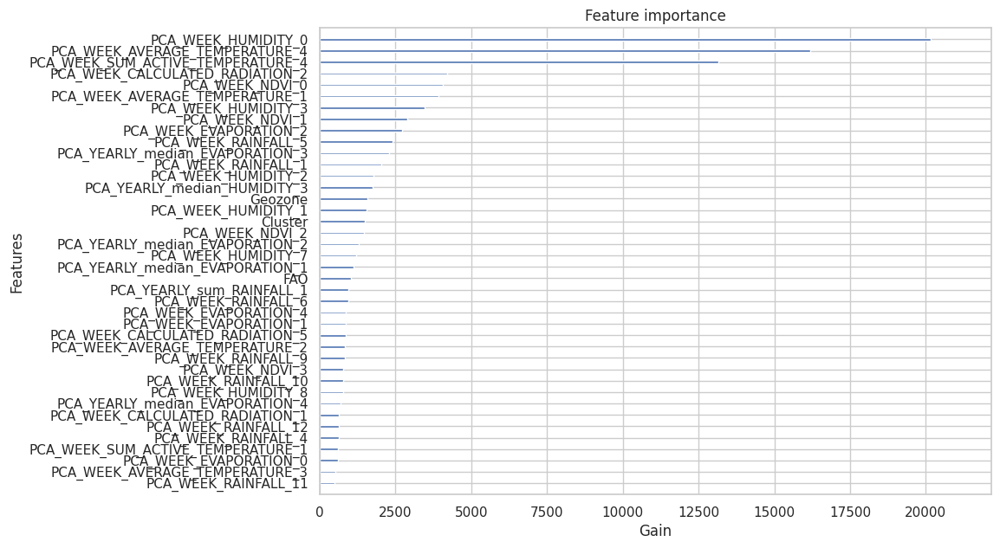

In [35]:
############ PLOT FEATURES IMPORTANSE WITHOUT FEATURES LOWER IMPORTANCE THEN RANDOM_NOISE #########################
fig, ax = plt.subplots(figsize=(10, 7))
baseline_model.fit(X_baseline, y_baseline)
plot_importance(baseline_model, ax=ax, importance_type='gain', show_values=False, xlabel='Gain', max_num_features=40);

In [36]:
######## GET LIST WITH CATEGORICAL FEATURES IN DATASET, some can be dropeed, update them for CatBoost inputs #########
cat_features = train[features_to_include].select_dtypes(include='category').columns.tolist()

######################## CATBOOST PROBE ###################
cb_model = CatBoostRegressor(iterations=200, silent=True, cat_features=cat_features)
cv_results = cross_validate(cb_model, X_baseline, y_baseline, cv=10, scoring='r2', return_train_score=True)
mean_test_score = np.mean(cv_results['test_score'])
train_test_score_rmse = np.sqrt(np.sum((cv_results['test_score'] - cv_results['train_score']) ** 2) / cv_results['test_score'].shape[0]) 

print('Test Scores on K-Folds: ', str(np.round(cv_results['test_score'], decimals=3)))
print('Train Scores on K-Folds: ', str(np.round(cv_results['train_score'], decimals=3)))
print(f'Mean Test Score: {np.round(mean_test_score, decimals=3)}')
print(f'Train/Test Score [RMSE]: {np.round(train_test_score_rmse, decimals=3)}')

Test Scores on K-Folds:  [0.767 0.806 0.835 0.798 0.796 0.84  0.783 0.778 0.812 0.807]
Train Scores on K-Folds:  [0.938 0.932 0.933 0.935 0.936 0.935 0.935 0.937 0.937 0.939]
Mean Test Score: 0.802
Train/Test Score [RMSE]: 0.136


In [37]:
# XGBoost FINE-TUNING WITH OPTUNA ########################
def objective(trial):
    
    regressor = XGBRegressor(n_estimators=trial.suggest_int('n_estimators', 70, 1000),
                             max_depth=trial.suggest_int('max_depth', 2, 6),
                             min_child_weight=trial.suggest_float('min_child_weight', 0, 6),
                             gamma=trial.suggest_float('gamma', 0, 6),
                             learning_rate=trial.suggest_float('learning_rate', 0.001, 0.3),
                             subsample=trial.suggest_float('subsample', 0.50, 1),
                             colsample_bytree=trial.suggest_float('colsample_bytree', 0.5, 1),
                             reg_lambda=trial.suggest_float('reg_lambda', 0, 5),
                             enable_categorical=True, max_cat_to_onehot=7)

    train_scores = []
    test_scores = []

    cv_results = cross_validate(regressor, X_train, y_train, cv=10, scoring='r2', return_train_score=True)
    mean_test_score = np.mean(cv_results['test_score'])
    train_test_score_rmse = np.sqrt(np.sum((cv_results['test_score'] - cv_results['train_score']) ** 2) / cv_results['test_score'].shape[0])

    return mean_test_score, train_test_score_rmse

optuna.logging.set_verbosity(optuna.logging.WARNING)
cv_study = optuna.create_study(directions=['maximize', 'minimize'])
cv_study.optimize(objective, n_trials=20)

study_results_zipped = [(hyper.values[0], hyper.values[1], hyper.params) for hyper in cv_study.best_trials]
ordered_study_results = sorted(study_results_zipped, key=lambda x: x[1])

min_max_list = []
# max

for i, hyper in enumerate(ordered_study_results):
    print(f'Model {i} Results:')
    print(f'Mean Test Score: {np.round(hyper[0], decimals=3)}\nTrain/Test Score [RMSE]: {np.round(hyper[1], decimals=3)}')
    print(hyper[2])
    print('\n')

    min_max_list.append(np.round(hyper[0], decimals=3))

print(min_max_list)


Model 0 Results:
Mean Test Score: 0.19
Train/Test Score [RMSE]: 0.014
{'n_estimators': 93, 'max_depth': 2, 'min_child_weight': 4.5996684473696945, 'gamma': 4.16816098570408, 'learning_rate': 0.003190064584550858, 'subsample': 0.6492658917147398, 'colsample_bytree': 0.9402428935569673, 'reg_lambda': 1.8012949989770726}


Model 1 Results:
Mean Test Score: 0.751
Train/Test Score [RMSE]: 0.054
{'n_estimators': 960, 'max_depth': 2, 'min_child_weight': 1.4467868635219079, 'gamma': 3.5451039207376587, 'learning_rate': 0.01107144793292399, 'subsample': 0.9711164669093673, 'colsample_bytree': 0.5184602436039224, 'reg_lambda': 1.5019230687374403}


Model 2 Results:
Mean Test Score: 0.788
Train/Test Score [RMSE]: 0.097
{'n_estimators': 142, 'max_depth': 5, 'min_child_weight': 4.091921344366607, 'gamma': 1.0839561636137949, 'learning_rate': 0.029838228657991565, 'subsample': 0.7240292927899714, 'colsample_bytree': 0.9261216921044708, 'reg_lambda': 0.5751079038696977}


Model 3 Results:
Mean Test S

In [38]:
###### TODO: both parameters (Test Metric & Train/Test Metric) should be taken into account, for prevent overfitting
max_position = min_max_list.index(max(min_max_list))

hyper = ordered_study_results[max_position]

print('optimal model:', max_position, hyper)

optimal model: 5 (0.8152339440874284, 0.16144849135452363, {'n_estimators': 324, 'max_depth': 6, 'min_child_weight': 4.939349246233478, 'gamma': 4.2324584693024665, 'learning_rate': 0.04774346240313049, 'subsample': 0.6773129755942147, 'colsample_bytree': 0.5770383286987794, 'reg_lambda': 0.2543353181042629})


In [39]:
########## FINAL XGBoost
xgb_final = XGBRegressor(n_estimators=hyper[2]['n_estimators'],
                         max_depth=hyper[2]['max_depth'],
                         min_child_weight=hyper[2]['min_child_weight'],
                         gamma=hyper[2]['gamma'],
                         learning_rate=hyper[2]['learning_rate'],
                         subsample=hyper[2]['subsample'],
                         colsample_bytree=hyper[2]['colsample_bytree'],
                         reg_lambda=hyper[2]['reg_lambda'],
                         enable_categorical=True, max_cat_to_onehot=7)

####### CROSS_VALIDATION
cv_results = cross_validate(xgb_final, X_train, y_train, cv=10, scoring='r2', return_train_score=True)
mean_test_score = np.mean(cv_results['test_score'])
train_test_score_rmse = np.sqrt(np.sum((cv_results['test_score'] - cv_results['train_score']) ** 2) / cv_results['test_score'].shape[0]) 

print('Test Scores on K-Folds: ', str(np.round(cv_results['test_score'], decimals=3)))
print('Train Scores on K-Folds: ', str(np.round(cv_results['train_score'], decimals=3)))
print(f'Mean Test Score: {np.round(mean_test_score, decimals=3)}')
print(f'Train/Test Score [RMSE]: {np.round(train_test_score_rmse, decimals=3)}')                     

Test Scores on K-Folds:  [0.774 0.822 0.853 0.806 0.802 0.859 0.797 0.793 0.826 0.822]
Train Scores on K-Folds:  [0.975 0.974 0.973 0.974 0.975 0.974 0.976 0.975 0.973 0.975]
Mean Test Score: 0.815
Train/Test Score [RMSE]: 0.161


In [40]:
################ CATBOOST FINE_TUNE ############
def objective(trial):
    
    regressor = CatBoostRegressor(iterations=trial.suggest_int('iterations', 100, 800),
                                  depth=trial.suggest_int('depth', 6, 10),
                                  l2_leaf_reg=trial.suggest_float('l2_leaf_reg', 0.0001, 0.1, log=True),
                                  silent=True, 
                                  cat_features=cat_features)       

    train_scores = []
    test_scores = []

    cv_results = cross_validate(regressor, X_train, y_train, cv=10, scoring='r2', return_train_score=True)
    mean_test_score = np.mean(cv_results['test_score'])
    train_test_score_rmse = np.sqrt(np.sum((cv_results['test_score'] - cv_results['train_score']) ** 2) / cv_results['test_score'].shape[0]) 
    
    return mean_test_score, train_test_score_rmse

# OPTIMIZATION
optuna.logging.set_verbosity(optuna.logging.WARNING)   
cv_study = optuna.create_study(directions=['maximize', 'minimize'])
cv_study.optimize(objective, n_trials=20)

min_max_list = []

study_results_zipped = [(hyper.values[0], hyper.values[1], hyper.params) for hyper in cv_study.best_trials]
ordered_study_results = sorted(study_results_zipped, key=lambda x: x[1])
for i, hyper in enumerate(ordered_study_results):
    print(f'Model {i} Results:')
    print(f'Mean Test Score: {np.round(hyper[0], decimals=3)}\nTrain/Test MAE K-Fold Score: {np.round(hyper[1], decimals=3)}')
    print(hyper[2])
    print('\n')

    min_max_list.append(np.round(hyper[0], decimals=3))


Model 0 Results:
Mean Test Score: 0.743
Train/Test MAE K-Fold Score: 0.059
{'iterations': 103, 'depth': 7, 'l2_leaf_reg': 0.03558525077665032}


Model 1 Results:
Mean Test Score: 0.754
Train/Test MAE K-Fold Score: 0.072
{'iterations': 100, 'depth': 8, 'l2_leaf_reg': 0.04432778733222683}


Model 2 Results:
Mean Test Score: 0.777
Train/Test MAE K-Fold Score: 0.088
{'iterations': 149, 'depth': 8, 'l2_leaf_reg': 0.001441948567217746}


Model 3 Results:
Mean Test Score: 0.795
Train/Test MAE K-Fold Score: 0.094
{'iterations': 424, 'depth': 6, 'l2_leaf_reg': 0.0006912191087128015}


Model 4 Results:
Mean Test Score: 0.804
Train/Test MAE K-Fold Score: 0.115
{'iterations': 441, 'depth': 7, 'l2_leaf_reg': 0.0004260067477365856}


Model 5 Results:
Mean Test Score: 0.813
Train/Test MAE K-Fold Score: 0.149
{'iterations': 618, 'depth': 8, 'l2_leaf_reg': 0.00906447751907556}


Model 6 Results:
Mean Test Score: 0.814
Train/Test MAE K-Fold Score: 0.151
{'iterations': 638, 'depth': 8, 'l2_leaf_reg': 0.0

In [41]:
###### TODO: both parameters (Test Metric & Train/Test Metric) should be taken into account, for prevent overfitting

max_position = min_max_list.index(max(min_max_list))

hyper = ordered_study_results[max_position]

print('optimal model:', max_position, hyper)


optimal model: 6 (0.8136161672175642, 0.15087661848918513, {'iterations': 638, 'depth': 8, 'l2_leaf_reg': 0.0002708937377482847})


In [42]:
######## FINAL CatBoost 
cb_final = CatBoostRegressor(iterations=hyper[2]['iterations'],
                             depth=hyper[2]['depth'],
                             l2_leaf_reg=hyper[2]['l2_leaf_reg'],
                             silent=True, cat_features=cat_features)

cv_results = cross_validate(cb_final, X_baseline, y_baseline, cv=10, scoring='r2', return_train_score=True)
mean_test_score = np.mean(cv_results['test_score'])
train_test_score_rmse = np.sqrt(np.sum((cv_results['test_score'] - cv_results['train_score']) ** 2) / cv_results['test_score'].shape[0]) # helpful for minimizing overfitting

print('Test Scores on K-Folds: ', str(np.round(cv_results['test_score'], decimals=3)))
print('Train Scores on K-Folds: ', str(np.round(cv_results['train_score'], decimals=3)))
print(f'Mean Test Score: {np.round(mean_test_score, decimals=3)}')
print(f'Train/Test Score K-Fold RMSE: {np.round(train_test_score_rmse, decimals=3)}')       


Test Scores on K-Folds:  [0.781 0.815 0.85  0.816 0.805 0.857 0.783 0.782 0.824 0.823]
Train Scores on K-Folds:  [0.964 0.962 0.961 0.961 0.961 0.962 0.963 0.962 0.963 0.964]
Mean Test Score: 0.814
Train/Test Score K-Fold RMSE: 0.151


In [43]:
#### ENSEMBLING XGBoost and CatBoost
stacked_model = StackingRegressor(estimators=[('xgb', xgb_final), ('cat', cb_final)], final_estimator=LinearRegression())

cv_results = cross_validate(stacked_model, X_train, y_train, cv=10, scoring='r2', return_train_score=True)
mean_test_score = np.mean(cv_results['test_score'])
train_test_score_rmse = np.sqrt(np.sum((cv_results['test_score'] - cv_results['train_score']) ** 2) / cv_results['test_score'].shape[0]) 

print('Test Scores on K-Folds: ', str(np.round(cv_results['test_score'], decimals=3)))
print('Train Scores on K-Folds: ', str(np.round(cv_results['train_score'], decimals=3)))
print(f'Mean Test Score: {np.round(mean_test_score, decimals=3)}')
print(f'Train/Test Score K-Fold RMSE: {np.round(train_test_score_rmse, decimals=3)}')         


Test Scores on K-Folds:  [0.782 0.823 0.858 0.815 0.808 0.862 0.793 0.79  0.83  0.827]
Train Scores on K-Folds:  [0.972 0.97  0.969 0.97  0.971 0.971 0.971 0.969 0.969 0.971]
Mean Test Score: 0.819
Train/Test Score K-Fold RMSE: 0.154


In [44]:
stacked_model.fit(X_train, y_train)

y_test_pred = stacked_model.predict(X_test)       

mae = mean_absolute_error(y_test, y_test_pred)
# mse = mean_squared_error(y_test, y_test_pred)
r2_score = r2_score(y_test, y_test_pred)
print(f'Test Data Score [MAE]: {np.round(mae, decimals=3)}')
print(f'Test Data Score [R2]:  {np.round(r2_score, decimals=3)}')     


Test Data Score [MAE]: 11.163
Test Data Score [R2]:  0.828


In [45]:
###### TODO: Final Submission 
stacked_model.fit(X_train, y_train)
res = stacked_model.predict(submission)   

sub_title['Yield'] = res
# submission = pd.concat([sub_title, submission], axis=1)

# Get the list of column names
columns = sub_title.columns.tolist()
# Move 'Yield' to position 2
columns.insert(1, columns.pop(columns.index('Yield')))
# Create a new DataFrame with the updated column order
sub_title = sub_title[columns]

sub_title.to_csv('submission.csv')                              

In [46]:
####### TODO: SHAP feature importance 

import shap

shap.initjs()          

In [47]:
model = CatBoostRegressor(iterations=hyper[2]['iterations'],
                             depth=hyper[2]['depth'],
                             l2_leaf_reg=hyper[2]['l2_leaf_reg'],
                             silent=True, cat_features=cat_features)

model.fit(X_train, y_train, eval_set=(X_test, y_test))


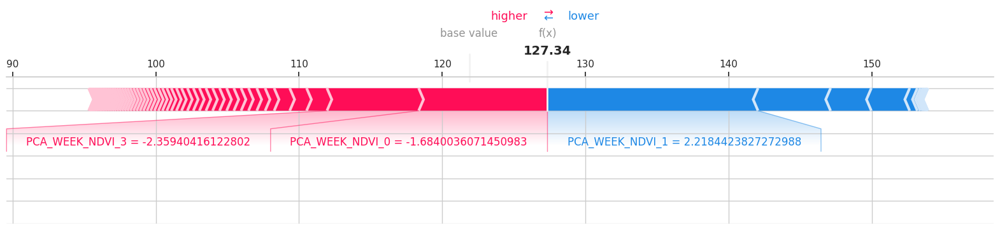

In [48]:
explainer = shap.TreeExplainer(model)
shap_values = explainer(X_train)

import matplotlib                              

shap.initjs()
# visualize the first prediction's explanation
shap.plots.force(shap_values[0, ...], matplotlib=matplotlib)


In [49]:
# visualize the training set predictions
# shap.plots.force(shap_values)

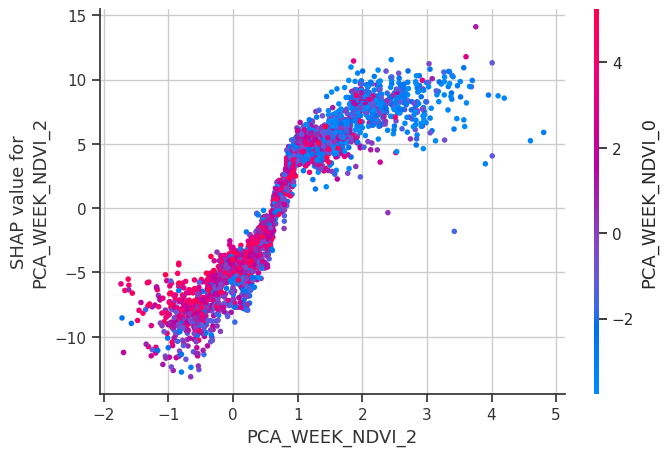

In [50]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("PCA_WEEK_NDVI_2", shap_values.values, X_train, interaction_index="PCA_WEEK_NDVI_0")

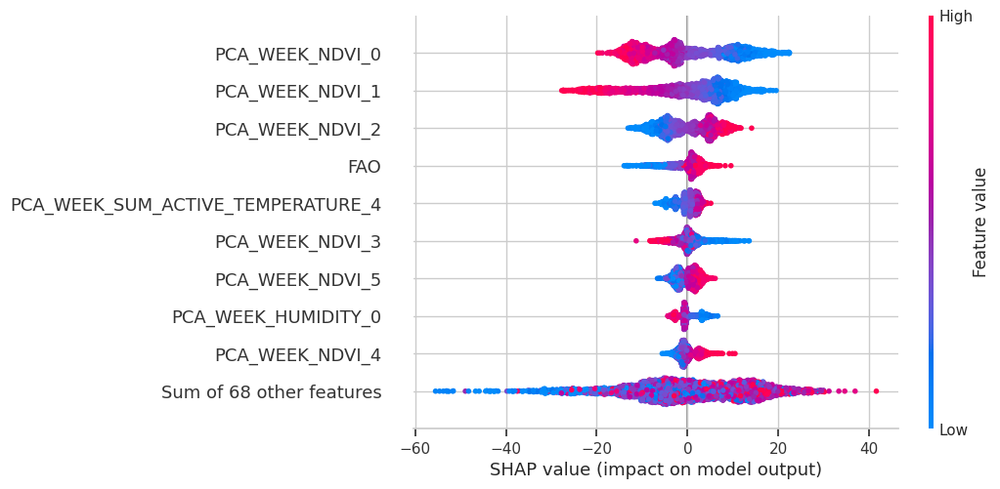

In [51]:
# summarize the effects of all the features
shap.plots.beeswarm(shap_values)


In [52]:
fn

NameError: name 'fn' is not defined